In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [34]:
%matplotlib notebook

## 1. Semantic Segmentation
Code sourced from https://colab.research.google.com/github/lexfridman/mit-deep-learning/blob/master/tutorial_driving_scene_segmentation/tutorial_driving_scene_segmentation.ipynb#scrollTo=kAbdmRmvq0Je

Rearrange the labels to the following categories (used in the Activity Forecasting Code)  
0 pavement 24 116 205 --> road   
1 sidewalk 107 142 35 --> sidewalk  
2 person 255 0 0 --> max(person, rider)  
3 car 255 255 0 --> max(car, truck, bus, motorcycle, train)  
4 building 200 200 50 --> building  
5 vobj 255 140 0 --> NA  
6 grass 0 255 0 --> max(vegetation, terrain)  
7 curb 0 0 255 --> road   
8 fence 200 0 200 --> fence  
9 gravel 50 100 50 --> terrain  
10 tree 25 190 0 --> NA  
11 statue 0 0 0 --> max(traffic sign, traffic light, pole)  
12 cart 0 0 0  --> NA  
13 bike 0 0 0 --> bike  
14 wall 0 0 0 --> wall 

In [2]:
!pip install tensorflow
!pip install pillow

In [3]:
!pip install sklearn

In [4]:
!pip install tabulate

In [2]:
# Tensorflow
import tensorflow as tf
print(tf.__version__)

# I/O libraries
import os
from io import BytesIO
import tarfile
import tempfile
from six.moves import urllib

# Helper libraries
import matplotlib
from matplotlib import gridspec
from matplotlib import pyplot as plt
import numpy as np
from PIL import Image
import cv2 as cv
from tqdm import tqdm
import IPython
from sklearn.metrics import confusion_matrix
from tabulate import tabulate

# Comment this out if you want to see Deprecation warnings
import warnings
warnings.simplefilter("ignore", DeprecationWarning)

1.15.0


In [3]:
class DeepLabModel(object):
    """Class to load deeplab model and run inference."""

    FROZEN_GRAPH_NAME = 'frozen_inference_graph'

    def __init__(self, tarball_path):
        """Creates and loads pretrained deeplab model."""
        self.graph = tf.Graph()
        graph_def = None

        # Extract frozen graph from tar archive.
        tar_file = tarfile.open(tarball_path)
        for tar_info in tar_file.getmembers():
            if self.FROZEN_GRAPH_NAME in os.path.basename(tar_info.name):
                file_handle = tar_file.extractfile(tar_info)
                graph_def = tf.compat.v1.GraphDef.FromString(file_handle.read())
                break
        tar_file.close()

        if graph_def is None:
            raise RuntimeError('Cannot find inference graph in tar archive.')

        with self.graph.as_default():
            tf.import_graph_def(graph_def, name='')
        self.sess = tf.compat.v1.Session(graph=self.graph)

    def run(self, image, INPUT_TENSOR_NAME = 'ImageTensor:0', OUTPUT_TENSOR_NAME = 'SemanticPredictions:0'):
        """Runs inference on a single image.

        Args:
            image: A PIL.Image object, raw input image.
            INPUT_TENSOR_NAME: The name of input tensor, default to ImageTensor.
            OUTPUT_TENSOR_NAME: The name of output tensor, default to SemanticPredictions.

        Returns:
            resized_image: RGB image resized from original input image.
            seg_map: Segmentation map of `resized_image`.
        """
        width, height = image.size
        target_size = (2049,1025)  # size of Cityscapes images
        resized_image = image.convert('RGB').resize(target_size, Image.ANTIALIAS)
        batch_seg_map = self.sess.run(
            OUTPUT_TENSOR_NAME,
            feed_dict={INPUT_TENSOR_NAME: [np.asarray(resized_image)]})
        seg_map = batch_seg_map[0]  # expected batch size = 1
        if len(seg_map.shape) == 2:
            seg_map = np.expand_dims(seg_map,-1)  # need an extra dimension for cv.resize
        seg_map = cv.resize(seg_map, (width,height), interpolation=cv.INTER_NEAREST)
        return seg_map

In [9]:
def create_label_colormap():
    """Creates a label colormap used in Cityscapes segmentation benchmark.

    Returns:
        A Colormap for visualizing segmentation results.
    """
    colormap = np.array([
        [128,  64, 128],
        [244,  35, 232],
        [ 70,  70,  70],
        [102, 102, 156],
        [190, 153, 153],
        [153, 153, 153],
        [250, 170,  30],
        [220, 220,   0],
        [107, 142,  35],
        [152, 251, 152],
        [ 70, 130, 180],
        [220,  20,  60],
        [255,   0,   0],
        [  0,   0, 142],
        [  0,   0,  70],
        [  0,  60, 100],
        [  0,  80, 100],
        [  0,   0, 230],
        [119,  11,  32],
        [  0,   0,   0]], dtype=np.uint8)
    return colormap


def label_to_color_image(label):
    """Adds color defined by the dataset colormap to the label.

    Args:
        label: A 2D array with integer type, storing the segmentation label.

    Returns:
        result: A 2D array with floating type. The element of the array
            is the color indexed by the corresponding element in the input label
            to the PASCAL color map.

    Raises:
        ValueError: If label is not of rank 2 or its value is larger than color
            map maximum entry.
    """
    if label.ndim != 2:
        raise ValueError('Expect 2-D input label')

    colormap = create_label_colormap()

    if np.max(label) >= len(colormap):
        raise ValueError('label value too large.')

    return colormap[label]


def vis_segmentation(image, seg_map):
    """Visualizes input image, segmentation map and overlay view."""
    plt.figure(figsize=(20, 4))
    grid_spec = gridspec.GridSpec(1, 4, width_ratios=[6, 6, 6, 1])

    plt.subplot(grid_spec[0])
    plt.imshow(image)
    plt.axis('off')
    plt.title('input image')

    plt.subplot(grid_spec[1])
    seg_image = label_to_color_image(seg_map).astype(np.uint8)
    plt.imshow(seg_image)
    plt.axis('off')
    plt.title('segmentation map')

    plt.subplot(grid_spec[2])
    plt.imshow(image)
    plt.imshow(seg_image, alpha=0.7)
    plt.axis('off')
    plt.title('segmentation overlay')

    unique_labels = np.unique(seg_map)
    ax = plt.subplot(grid_spec[3])
    plt.imshow(FULL_COLOR_MAP[unique_labels].astype(np.uint8), interpolation='nearest')
    ax.yaxis.tick_right()
    plt.yticks(range(len(unique_labels)), LABEL_NAMES[unique_labels])
    plt.xticks([], [])
    ax.tick_params(width=0.0)
    plt.grid('off')
    plt.show()


LABEL_NAMES = np.asarray([
    'road', 'sidewalk', 'building', 'wall', 'fence', 'pole', 'traffic light',
    'traffic sign', 'vegetation', 'terrain', 'sky', 'person', 'rider', 'car', 'truck',
    'bus', 'train', 'motorcycle', 'bicycle', 'void'])

FULL_LABEL_MAP = np.arange(len(LABEL_NAMES)).reshape(len(LABEL_NAMES), 1)
FULL_COLOR_MAP = label_to_color_image(FULL_LABEL_MAP)

In [5]:
# returns a warped version of the original segmap
def transform_seg_map(seg_map, H):
    warped_seg_map = np.zeros(seg_map.shape, dtype=int)
    print(seg_map.shape)
    for x in range(len(seg_map[0])):
        for y in range(len(seg_map)):
            coords = transform_coords(x, y, H)
            [newx, newy] = coords
            newx = int(newx)
            newy = int(newy)
            
            if newx >= 0 and newy >= 0 and newx < len(seg_map[0]) and newy < len(seg_map):
                warped_seg_map[newy][newx] = seg_map[y][x] 
    return warped_seg_map

In [6]:
def transform_logits(logits, H):
    warped_logits = np.zeros(logits.shape, dtype=float)
    print(warped_logits.shape)
    for x in range(len(logits[0])):
        for y in range(len(logits)):
            coords = transform_coords(x, y, H)
            [newx, newy] = coords
            newx = int(newx)
            newy = int(newy)
            
            if newx >= 0 and newy >= 0 and newx < len(logits[0]) and newy < len(logits):
                warped_logits[newy][newx] = logits[y][x]
                
    return warped_logits

In [7]:
MODEL_NAME = 'mobilenetv2_coco_cityscapes_trainfine'
#MODEL_NAME = 'xception65_cityscapes_trainfine'

_DOWNLOAD_URL_PREFIX = 'http://download.tensorflow.org/models/'
_MODEL_URLS = {
    'mobilenetv2_coco_cityscapes_trainfine':
        'deeplabv3_mnv2_cityscapes_train_2018_02_05.tar.gz',
    'xception65_cityscapes_trainfine':
        'deeplabv3_cityscapes_train_2018_02_06.tar.gz',
}
_TARBALL_NAME = 'deeplab_model.tar.gz'

model_dir = tempfile.mkdtemp()
tf.io.gfile.makedirs(model_dir)

download_path = os.path.join(model_dir, _TARBALL_NAME)
print('downloading model, this might take a while...')
urllib.request.urlretrieve(_DOWNLOAD_URL_PREFIX + _MODEL_URLS[MODEL_NAME], download_path)
print('download completed! loading DeepLab model...')

MODEL = DeepLabModel(download_path)
print('model loaded successfully!')

downloading model, this might take a while...
download completed! loading DeepLab model...
model loaded successfully!


In [8]:
# modified the below function to warp the segmentation maps instead of running on original images
def run_transformed_visualization(SAMPLE_IMAGE, TRANSFORMED_IMAGE, H):
    """Inferences DeepLab model and visualizes result."""
    original_im = Image.open(SAMPLE_IMAGE)
    transformed_im = Image.open(TRANSFORMED_IMAGE)
    seg_map = MODEL.run(original_im)
    transformed_seg_map = transform_seg_map(seg_map, H)
    
    seg_map_logits = MODEL.run(original_im, OUTPUT_TENSOR_NAME='ResizeBilinear_3:0')
    transformed_seg_map_logits = transform_logits(seg_map_logits, H)
    
    # vis_segmentation(transformed_im, transformed_seg_map)
    
    return transformed_seg_map_logits

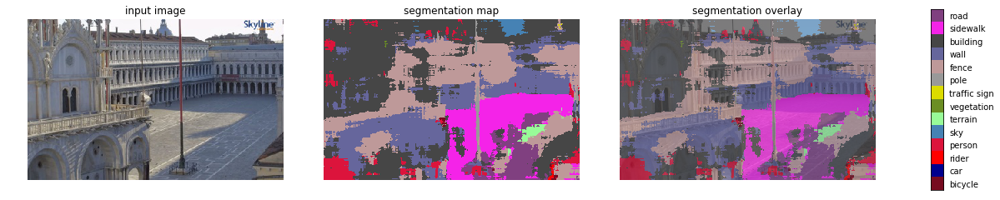

In [14]:
SAMPLE_IMAGE = 'sample_images/sanmarco_small.jpg'

def run_visualization(SAMPLE_IMAGE):
    """Inferences DeepLab model and visualizes result."""
    original_im = Image.open(SAMPLE_IMAGE)
    seg_map = MODEL.run(original_im)
    vis_segmentation(original_im, seg_map)

run_visualization(SAMPLE_IMAGE)

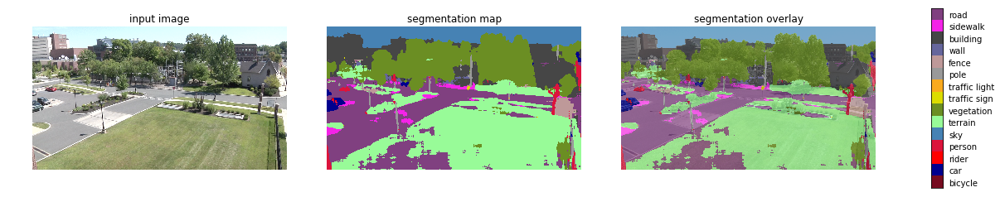

In [10]:
run_visualization("sample_images/sample3.png")

In [11]:
original_im = Image.open("sample_images/sample2.png")
seg_map = MODEL.run(original_im)
seg_map_logits = MODEL.run(original_im, OUTPUT_TENSOR_NAME='ResizeBilinear_3:0')

In [12]:
seg_map

array([[2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       ...,
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [0, 0, 0, ..., 2, 2, 2]], dtype=int32)

In [16]:
seg_map_logits

array([[[-0.5168223 , -0.01950888,  5.1671352 , ...,  0.9902062 ,
         -3.5945675 , -3.0972881 ],
        [-0.5168223 , -0.01950888,  5.1671352 , ...,  0.9902062 ,
         -3.5945675 , -3.0972881 ],
        [-0.50516504,  0.01013022,  5.1174736 , ...,  1.0059836 ,
         -3.5796561 , -3.1136177 ],
        ...,
        [-0.88601696, -0.7767638 ,  5.211636  , ...,  0.03514653,
         -2.274844  , -2.0588994 ],
        [-0.888096  , -0.82648283,  5.226769  , ...,  0.00849131,
         -2.2047143 , -1.9803717 ],
        [-0.8901749 , -0.87620187,  5.2419024 , ..., -0.01816393,
         -2.134585  , -1.9018441 ]],

       [[-0.5168223 , -0.01950888,  5.1671352 , ...,  0.9902062 ,
         -3.5945675 , -3.0972881 ],
        [-0.5168223 , -0.01950888,  5.1671352 , ...,  0.9902062 ,
         -3.5945675 , -3.0972881 ],
        [-0.50516504,  0.01013022,  5.1174736 , ...,  1.0059836 ,
         -3.5796561 , -3.1136177 ],
        ...,
        [-0.88601696, -0.7767638 ,  5.211636  , ...,  

### Resize images for faster saving / loading

In [12]:
def image_resize(image, width = None, height = None, inter = cv2.INTER_AREA):
    # initialize the dimensions of the image to be resized and
    # grab the image size
    dim = None
    (h, w) = image.shape[:2]

    # if both the width and height are None, then return the
    # original image
    if width is None and height is None:
        return image

    # check to see if the width is None
    if width is None:
        # calculate the ratio of the height and construct the
        # dimensions
        r = height / float(h)
        dim = (int(w * r), height)

    # otherwise, the height is None
    else:
        # calculate the ratio of the width and construct the
        # dimensions
        r = width / float(w)
        dim = (width, int(h * r))

    # resize the image
    resized = cv2.resize(image, dim, interpolation = inter)

    # return the resized image
    return resized

In [13]:
cv2.imwrite("sample_images/sanmarco_small.jpg", image_resize(cv2.imread("sample_images/sanmarco.jpg"), width=384, height=216))

True

<IPython.core.display.Javascript object>


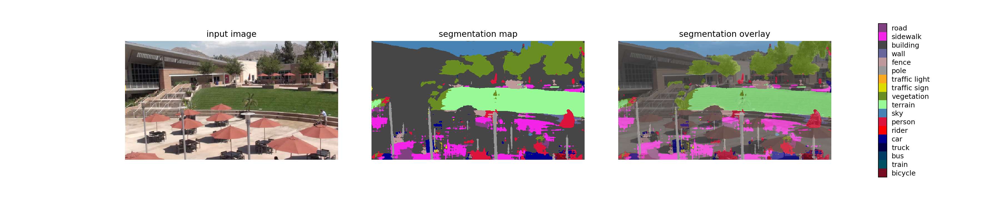

In [19]:
# run visualization on resized sample image
run_visualization("sample_images/small_sample2.png")

<IPython.core.display.Javascript object>


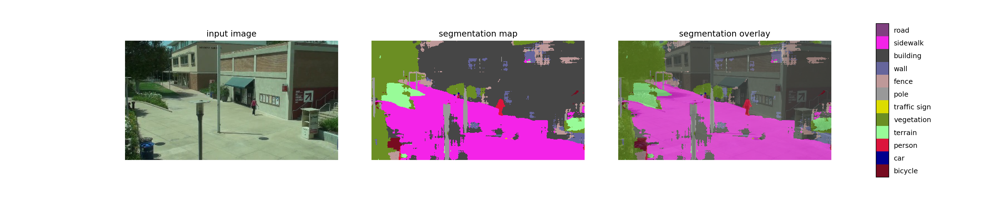

In [20]:
# run visualization on resized sample image
run_visualization("homographies/VIRAT_S_0102.jpg")

### Save to YAML

In [11]:
!pip install pyyaml

In [15]:
import yaml
def opencv_matrix_constructor(loader, node):
    mapping = loader.construct_mapping(node, deep=True)
    mat = np.array(mapping["data"])
    mat.resize(mapping["rows"], mapping["cols"])
    return mat
yaml.add_constructor(u"tag:yaml.org,2002:opencv-matrix", opencv_matrix_constructor)

# A yaml representer is for dumping structs into a yaml node.
# So for an opencv_matrix type (to be compatible with c++'s FileStorage) we save the rows, cols, type and flattened-data
def opencv_matrix_representer(dumper, mat):
    if len(mat.shape)>1: cols=int(mat.shape[1])
    else: cols=1
    mapping = {'rows': int(mat.shape[0]), 'cols': cols, 'dt': 'f', 'data': mat.reshape(-1).tolist()}
    return dumper.represent_mapping(u"tag:yaml.org,2002:opencv-matrix", mapping)
yaml.add_representer(np.ndarray, opencv_matrix_representer)

In [16]:
def convertToYML(seg_map_logits, filename):
    # rearrange so that the column with the classes is moved to the front
    resized_seg = np.moveaxis(seg_map_logits, 2, 0)
    
    # fit columns into required features
    pavement = resized_seg[0] / np.max(resized_seg[0]) # road
    sidewalk = resized_seg[1] / np.max(resized_seg[1])# sidewalk
    person = np.maximum(resized_seg[11], resized_seg[12]) # person, rider
    person = person / np.max(person)
    car = np.maximum.reduce([resized_seg[13], resized_seg[14], resized_seg[15], resized_seg[16], resized_seg[17]]) # car, truck, bus, motorcyle, train
    car = car / np.max(car)
    building = resized_seg[2] / np.max(resized_seg[2]) # building
    vobj = np.zeros(resized_seg[0].shape) # NA --> not important for final training data
    grass = np.maximum(resized_seg[8], resized_seg[9]) # vegetation, terrain
    grass = grass / np.max(grass)
    curb = resized_seg[0] / np.max(resized_seg[0]) # road
    fence = resized_seg[4] / np.max(resized_seg[4])# fence
    gravel = resized_seg[9] / np.max(resized_seg[9]) # terrain
    tree = np.zeros(resized_seg[0].shape) # NA --> not important for final training data
    statue = np.maximum.reduce([resized_seg[5], resized_seg[6], resized_seg[7]]) # pole, traffic light, traffic sign
    statue = statue / np.max(statue)
    cart = np.zeros(resized_seg[0].shape) # NA --> not important for final training data
    bike = resized_seg[18] / np.max(resized_seg[18])# bicycle
    wall = resized_seg[3] / np.max(resized_seg[3]) # wall
    
    res = [pavement, sidewalk, person, car, building, vobj, grass, curb, 
           fence, gravel, tree, statue, cart, bike, wall]
    labels = ["pavement", "sidewalk", "person", "car", "building", "vobj", "grass", "curb", 
              "fence", "gravel", "tree", "statue", "cart", "bike", "wall"]
    
    # write seg_map to file
    f = open(filename, "w")
    f.write("%YAML:1.0\n")
        
    for i in range(15):
        f.write(labels[i] + ": !!opencv-matrix\n")
        f.write("   rows: " + str(216) + "\n")
        f.write("   cols: " + str(384) + "\n")
        f.write("   dt: f\n")
        f.write("   data: [")
        
        length = res[i].size
        flat = res[i].flatten()
        
        for j in range(length):
            if j == length - 1:
                f.write(str(flat[j]) + "]\n")
            else:
                f.write(str(flat[j]) + ", ")
            if j >= 5 and j % 5 == 0:
                f.write("\n      ")
   

<IPython.core.display.Javascript object>


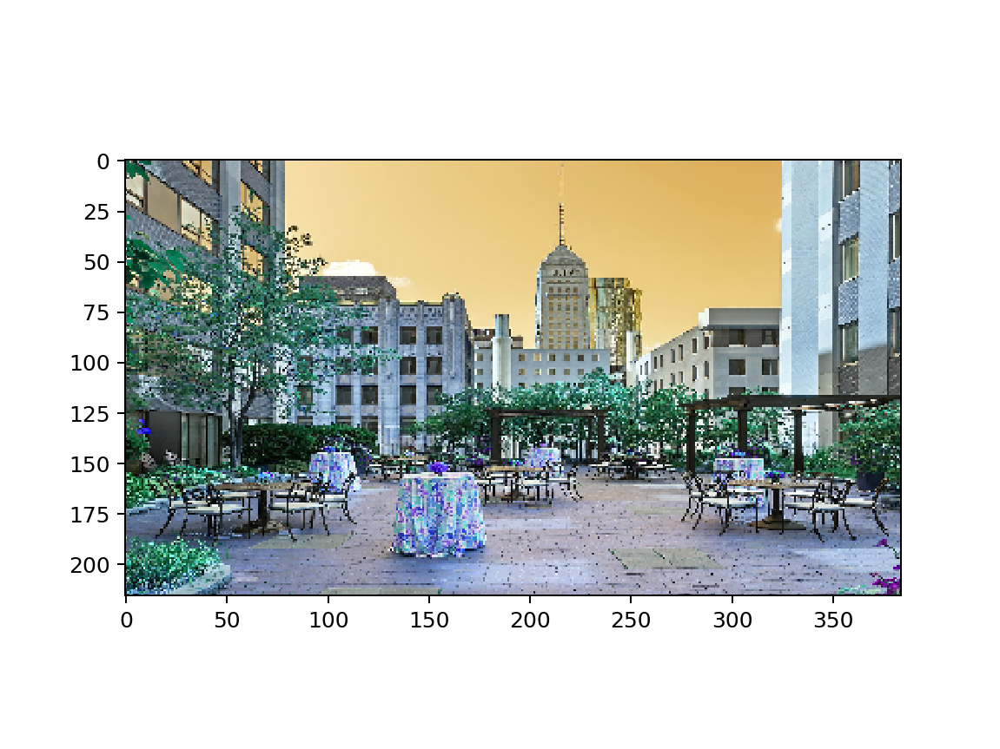

In [39]:
plt.imshow(cv2.imread("sample_images/small_suburban_sample.png"))

<IPython.core.display.Javascript object>


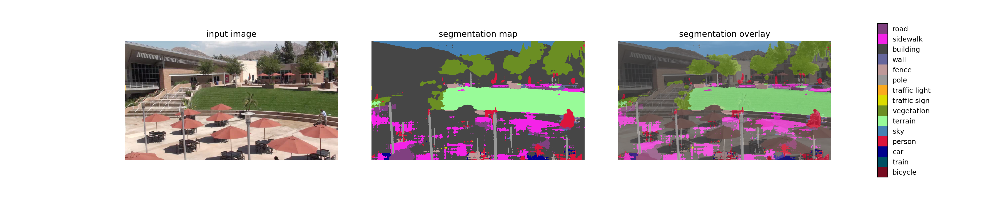

In [25]:
run_visualization("sample_images/sample2.png")

<IPython.core.display.Javascript object>


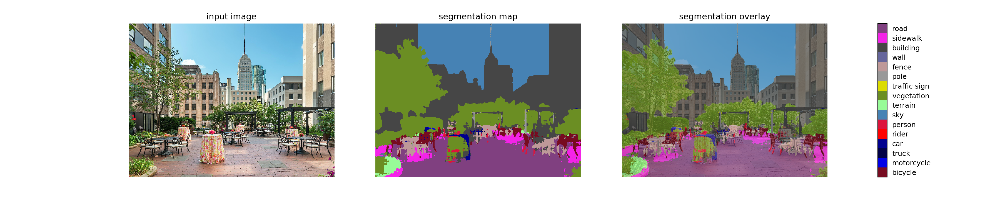

In [103]:
run_visualization("sample_images/suburban_sample.jpeg")

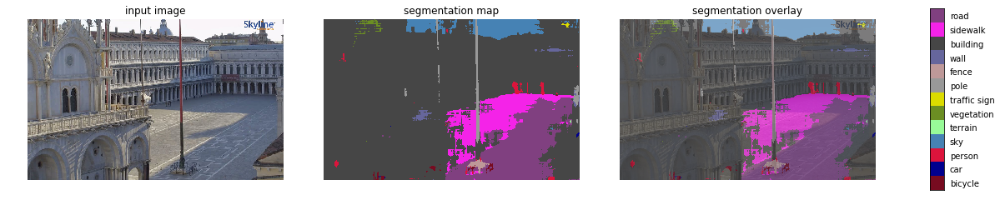

In [25]:
run_visualization("sample_images/sanmarco.jpg")

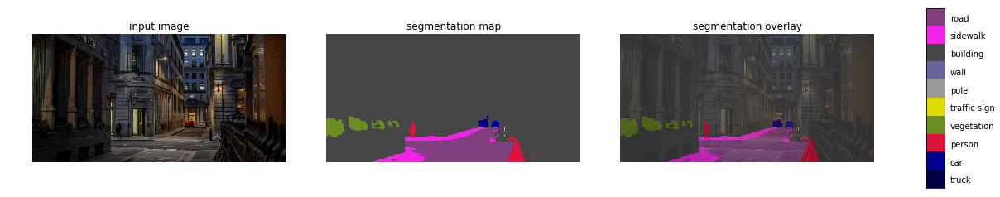

In [26]:
run_visualization("sample_images/london.png")

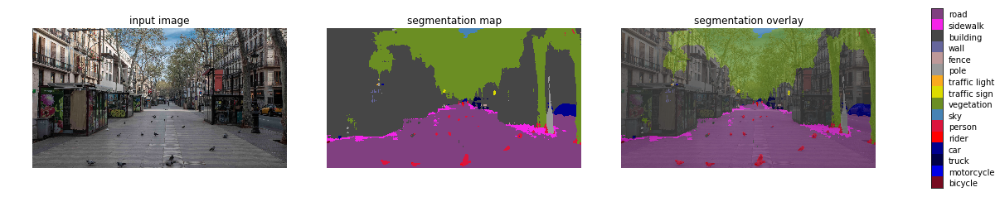

In [27]:
run_visualization("sample_images/barcelona.png")

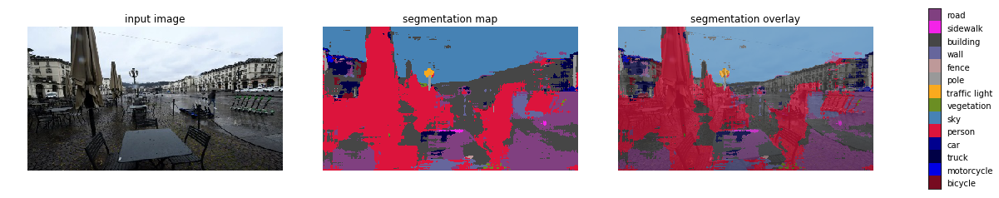

In [26]:
run_visualization("sample_images/turin_small.jpg")

In [14]:
def one_hot_encode(seg_map_logits):
    b = np.zeros(seg_map_logits.shape)
    for i in range(len(seg_map_logits)):
        for j in range(len(seg_map_logits[0])):
            max_idx = np.argmax(seg_map_logits[i][j])
            interm = np.zeros(len(seg_map_logits[i][j]))
            interm[max_idx] = 1
            b[i][j] = interm
#         b[i].append(interm)
    return np.array(b)

In [15]:
# get the average probability vector for each feature
def get_average_seg_maps(seg_map_logits):
    averages = np.zeros((seg_map_logits.shape[2], seg_map_logits.shape[2]))
    running_ct = np.zeros((seg_map_logits.shape[2]))
    
    # compute average, maintain running sum of count
    for i in range(seg_map_logits.shape[0]):
        for j in range(seg_map_logits.shape[1]):
            prob_vector = seg_map_logits[i][j]
            max_idx = np.argmax(prob_vector)
            averages[max_idx] += prob_vector
            running_ct[max_idx] += 1
    
    # divide each prob vector by the count
    for i in range(len(running_ct)):
        averages[i] = averages[i] / running_ct[i]
        
    return averages, running_ct

In [31]:
# save image of sample plaza (in perspective) to YAML file
img_name = "cityscapes"
img_type = ".png"
original_im = cv2.imread("sample_images/" + img_name + img_type)
original_im = cv2.resize(original_im, (384, 216))
cv2.imwrite("sample_images/" + img_name + "_small.jpg", original_im)
cv2.imwrite("oc_demo/" + "walk_" + img_name + ".jpg", original_im)
resized_im = Image.open("sample_images/" + img_name + "_small.jpg")
seg_map = MODEL.run(resized_im)
seg_map_logits = MODEL.run(resized_im, OUTPUT_TENSOR_NAME='ResizeBilinear_3:0')

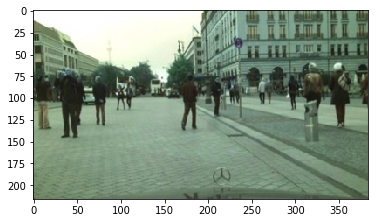

In [32]:
plt.imshow(original_im)

In [200]:
# compute averages for small_sample4
averages_sample4, running_ct_sample4 = get_average_seg_maps(seg_map_logits)
print(running_ct_sample4.shape, averages_sample4.shape)

(19,) (19, 19)


/Users/uuberoy/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()


In [176]:
colormap = [
        "12864128", # road
        "24435232", # sidewalk
        "707070", # building
        "102102156", # wall
        "190153153", # fence
        "153153153", # pole
        "25017030", # traffic light
        "2202200", # traffic sign
        "10714235", # vegetation
        "152251152", # terrain
        "70130180", # sky
        "2202060", # person
        "25000", # rider
        "00142", # car
        "0070", # truck
        "060100", # bus
        "080100", # train
        "00230", # motorcycle
        "1191132" # bicycle
]

In [22]:
# process mask and modify probability vectors accordingly
def process_mask(filename, seg_map_logits, averages):
    im_mask = cv2.imread(filename)
    masked_seg_logits = np.copy(seg_map_logits)

    for i in range(im_mask.shape[0]):
        for j in range(im_mask.shape[1]):
            if (im_mask[i][j] == [255, 255, 255]).all():
                continue
            else:
                s = [str(x) for x in im_mask[i][j]] 
                res = "".join(reversed(s))
                if res in colormap:
                    idx = colormap.index(res)
                    print(idx)
                    masked_seg_logits[i][j] = averages[idx]
                
    return masked_seg_logits

In [202]:
masked_seg_logits_sample4 = process_mask("sample_images/small_sample4_mask2.png", seg_map_logits, averages_sample4)

1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


In [203]:
# convert mask to YML
convertToYML(masked_seg_logits_sample4, "ioc_demo/transfer_feat/VIRAT_S_06007_12_2090_2220_2_features.yml")

In [91]:
converted_seg_map_logits = one_hot_encode(seg_map_logits)
converted_seg_map_logits.shape

(216, 384, 19)

In [33]:
convertToYML(seg_map_logits, "ioc_demo/transfer_feat/VIRAT_S_06005_17_2090_2220_2_features.yml")

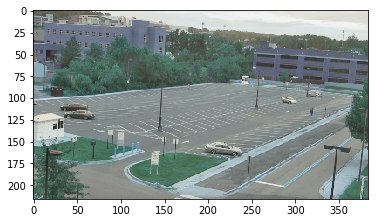

In [32]:
plt.imshow(cv2.imread("sample_images/small_sample4.png"))

## 2. Top-down Images
Another form of intermediate data required by the source code for Activity Forecasting. Each image is warped to a birdseye perspective using OpenCV functions.

<IPython.core.display.Javascript object>


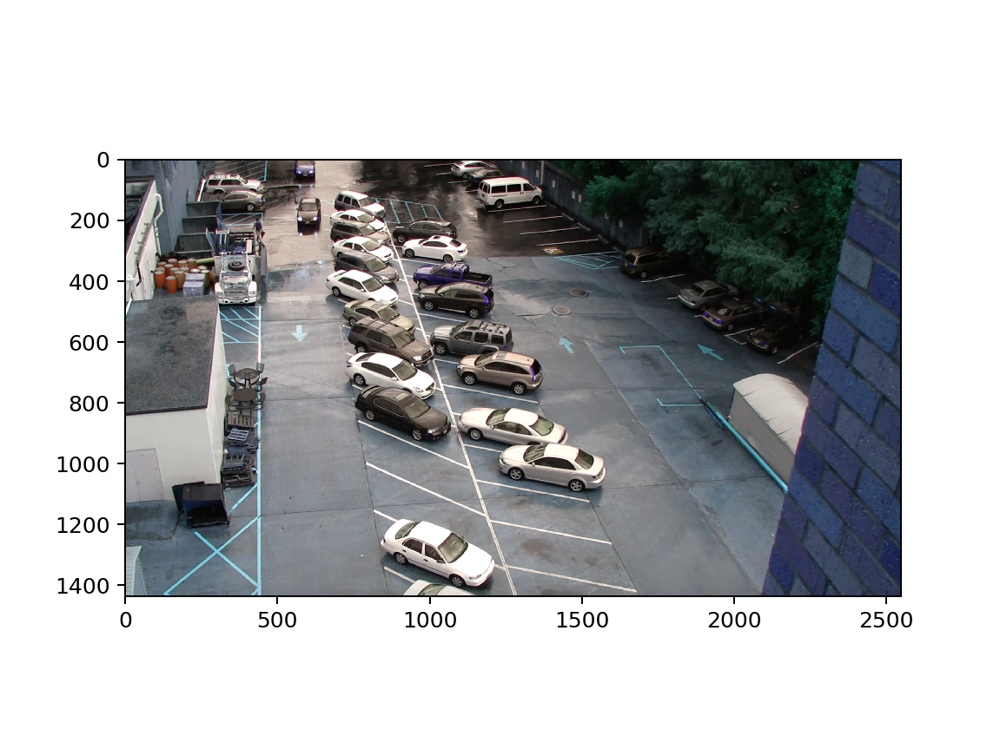

In [253]:
plt.imshow(cv2.imread("sample1.png"))

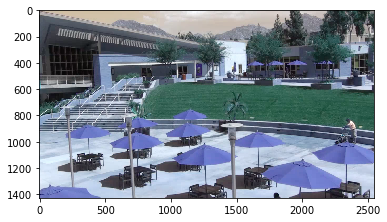

In [91]:
plt.imshow(cv2.imread("sample2.png"))

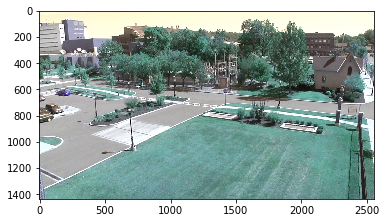

In [99]:
plt.imshow(cv2.imread("sample3.png"))

<IPython.core.display.Javascript object>


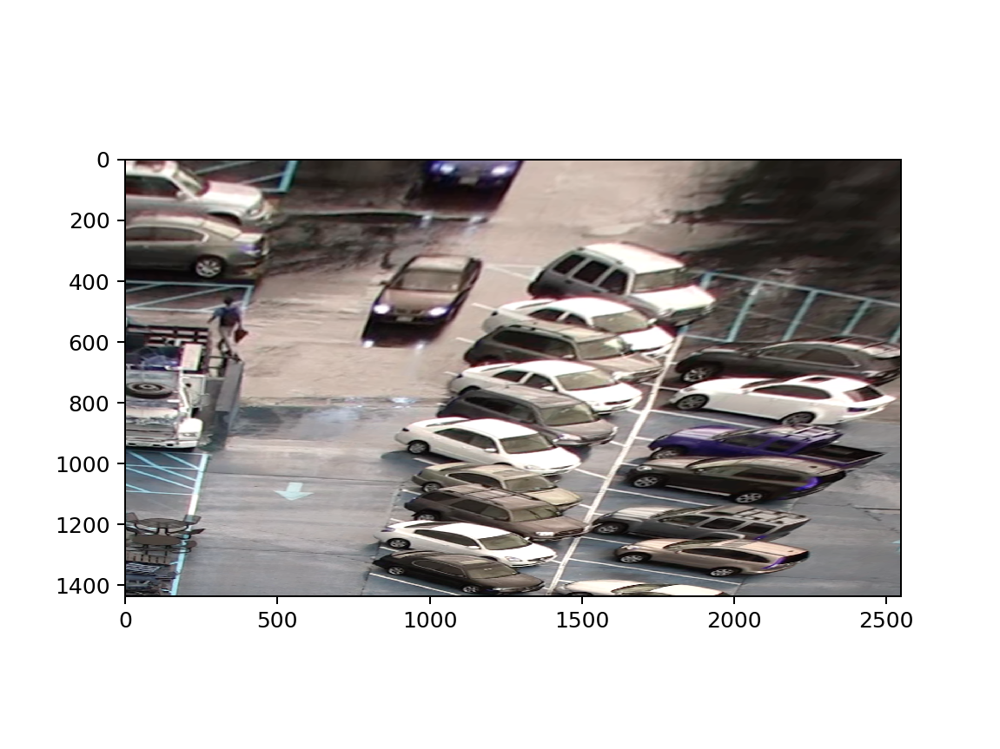

In [256]:
plt.imshow(cv2.imread("homographies/VIRAT_S_0502.jpg"))

In [257]:
rects = [] # tl, tr, br, bl
rects.append(np.array([(338, 53), (872, 14), (1623, 806), (346, 1069)], dtype="float32"))
rects.append(np.array([(500, 0), (2500, 500), (2500, 1400), (0, 1400)], dtype="float32")) 
rects.append(np.array([(500, 500), (2500, 700), (1750, 1200), (0, 600)], dtype="float32")) 
rects.append(np.array([(1469, 492), (2551, 657), (1876, 1424), (0, 687)], dtype="float32"))

In [258]:
NUM_IMAGES = len(rects)
warps = []
for i in range(NUM_IMAGES):
    img = cv2.imread("sample" + str(i + 1) + ".png")
    width, height = len(img[0]), len(img)
    
    dst = np.array([
        [0, 0],
        [width - 1, 0],
        [width - 1, height - 1],
        [0, height - 1]], dtype = "float32")
    
    rect = rects[i]
    
    M = cv2.getPerspectiveTransform(rect, dst)
    
    warps.append(cv2.warpPerspective(img.copy(), M, (width, height)))

In [259]:
plt.imshow(warps[0])

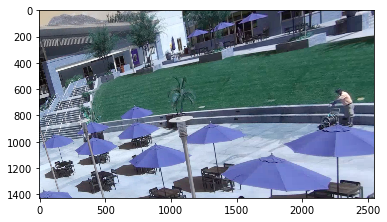

In [109]:
plt.imshow(warps[1])

<IPython.core.display.Javascript object>


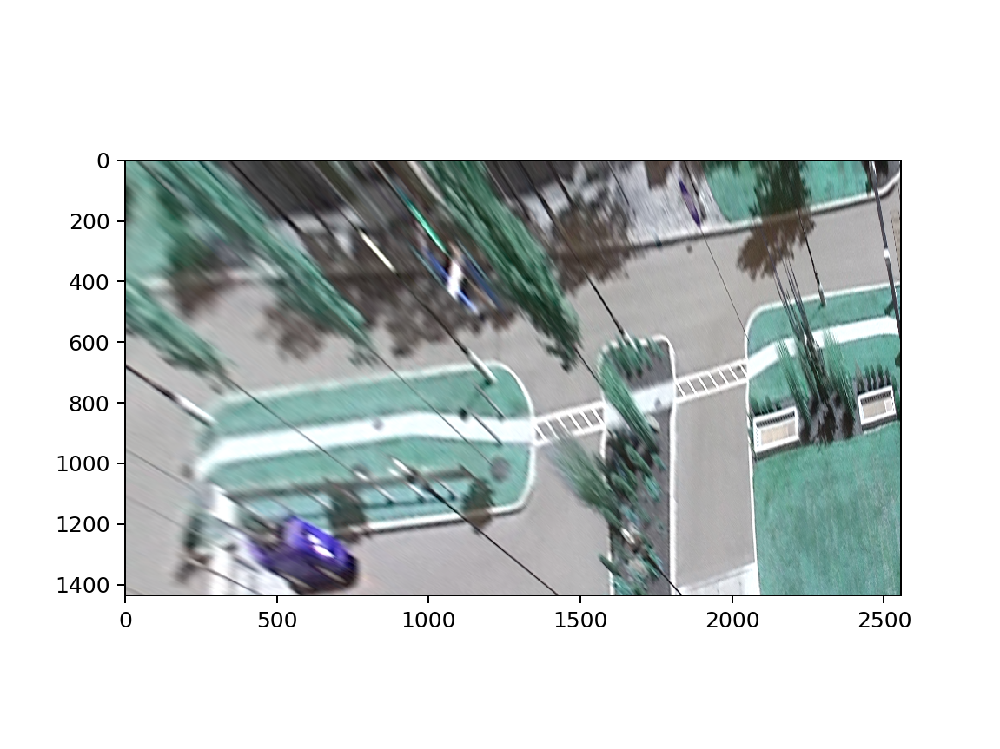

In [252]:
plt.imshow(warps[2])

In [251]:
plt.imshow(warps[3])

### A different process for creating the topdown images
Code adapted from https://nikolasent.github.io/opencv/2017/05/07/Bird's-Eye-View-Transformation.html

In [244]:
test = [cv2.imread("sample1.png"), cv2.imread("sample2.png"), cv2.imread("sample3.png"), cv2.imread("sample4.png"), cv2.imread("sample5.png")]
IMAGE_H, IMAGE_W = [len(test[0][0]), len(test[1][0]), len(test[2][0]), len(test[3][0]), len(test[4][0])], [len(test[0]), len(test[1]), len(test[2]), len(test[3]), len(test[4])]
plt.imshow(test[0])

In [245]:
warps2 = []
dst = np.float32([[0, IMAGE_H[0]], [IMAGE_W[0], IMAGE_H[0]], [0, 0], [IMAGE_W[0], 0]])
src = np.float32([[480, IMAGE_H[0]], [2250, 700], [470, 0], [1250, 0]])
M = cv2.getPerspectiveTransform(src, dst) # The transformation matrix
Minv = cv2.getPerspectiveTransform(dst, src) # Inverse transformation

# test_cropped = test[0:IMAGE_W, 480:IMAGE_W] # Apply np slicing for ROI crop
test_warped = cv2.warpPerspective(test[0].copy(), M, (IMAGE_W[0], IMAGE_H[0])) # Image warping
warps2.append(test_warped)
plt.imshow(cv2.cvtColor(test_warped, cv2.COLOR_BGR2RGB)) # Show results
plt.show()

In [247]:
plt.imshow(test[1])

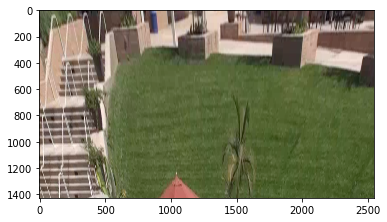

In [236]:
dst = np.float32([[0, IMAGE_H[1]], [IMAGE_W[1], IMAGE_H[1]], [0, 0], [IMAGE_W[1], 0]])
src = np.float32([[0, 1200], [IMAGE_W[1], 1200], [600, 500], [IMAGE_W[1], 500]])
M = cv2.getPerspectiveTransform(src, dst) # The transformation matrix
Minv = cv2.getPerspectiveTransform(dst, src) # Inverse transformation

# test_cropped = test[0:IMAGE_W, 480:IMAGE_W] # Apply np slicing for ROI crop
test_warped = cv2.warpPerspective(test[1].copy(), M, (IMAGE_H[1], IMAGE_W[1])) # Image warping
warps2.append(test_warped)
plt.imshow(cv2.cvtColor(test_warped, cv2.COLOR_BGR2RGB)) # Show results
plt.show()

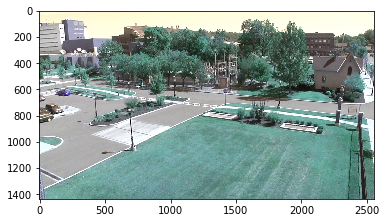

In [231]:
plt.imshow(test[2])

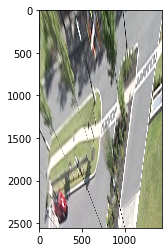

In [266]:
dst = np.float32([[0, IMAGE_H[2]], [IMAGE_W[2], IMAGE_H[2]], [0, 0], [IMAGE_W[2], 0]]) #bl, br, tl, tr
src = np.float32([[0, 600], [IMAGE_W[2], 1200], [500, 500], [IMAGE_W[2], 700]])
M = cv2.getPerspectiveTransform(src, dst) # The transformation matrix
Minv = cv2.getPerspectiveTransform(dst, src) # Inverse transformation

# test_cropped = test[0:IMAGE_W, 480:IMAGE_W] # Apply np slicing for ROI crop
test_warped = cv2.warpPerspective(test[2].copy(), M, (IMAGE_W[2], IMAGE_H[2])) # Image warping
warps2.append(test_warped)
plt.imshow(cv2.cvtColor(test_warped, cv2.COLOR_BGR2RGB)) # Show results
plt.show()

In [243]:
plt.imshow(test[3])

NameError: name 'test' is not defined

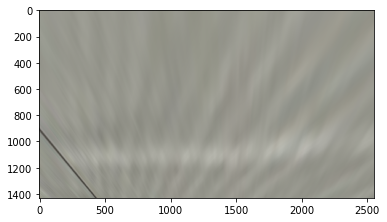

In [283]:
dst = np.float32([[0, IMAGE_H[3]], [IMAGE_W[3], IMAGE_H[3]], [0, 0], [IMAGE_W[3], 0]]) #bl, br, tl, tr
src = np.float32([[0, 650], [1500, 1100], [1600, 600], [IMAGE_W[3], 630]])
M = cv2.getPerspectiveTransform(src, dst) # The transformation matrix
Minv = cv2.getPerspectiveTransform(dst, src) # Inverse transformation

# test_cropped = test[0:IMAGE_W, 480:IMAGE_W] # Apply np slicing for ROI crop
test_warped = cv2.warpPerspective(test[3].copy(), M, (IMAGE_H[3], IMAGE_W[3])) # Image warping
warps2.append(test_warped)
plt.imshow(cv2.cvtColor(test_warped, cv2.COLOR_BGR2RGB)) # Show results
plt.show()

In [284]:
M

array([[-5.11779641e-02, -1.63769485e+00,  1.06450165e+03],
       [-5.31707012e-01, -3.01300640e+00,  2.65853506e+03],
       [-2.27076727e-04, -1.11675146e-03,  1.00000000e+00]])

### Using the VIRAT homography matrices to warp

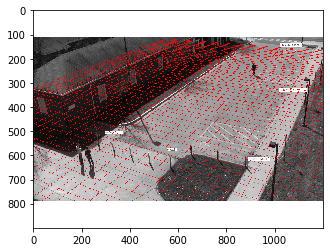

In [278]:
plt.imshow(test[4])

In [10]:
# read homography matrix
def parse_homography(path):
    h = []
    with open(path, 'r') as f:
        for line in f:
            h.append([float(l) for l in line.strip().split(",")])
    h = np.array(h)
    return h

In [315]:
frame = cv2.imread("homographies/VIRAT_S_0002.jpg")

In [316]:
plt.imshow(frame)

In [186]:
cols, rows = frame.shape[1], frame.shape[0]

In [192]:
M

array([[ 2.88403938e+02,  1.94917323e-01, -9.79581908e+01],
       [-2.29133696e+03,  1.50334937e+00,  7.75101480e+02],
       [-2.68618729e+04,  2.24026445e-03,  1.00000000e+00]])

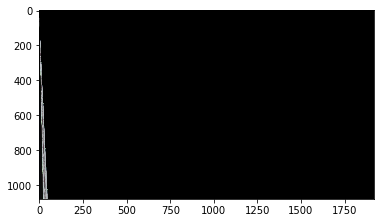

In [194]:
plt.imshow(cv2.warpPerspective(frame.copy(), M, (frame.shape[1], frame.shape[0]), cv2.INTER_CUBIC, cv2.BORDER_CONSTANT))

In [195]:
h_inv = np.linalg.inv(h)

In [196]:
frame = cv2.imread("VIRAT_S_0000.jpg")

<IPython.core.display.Javascript object>


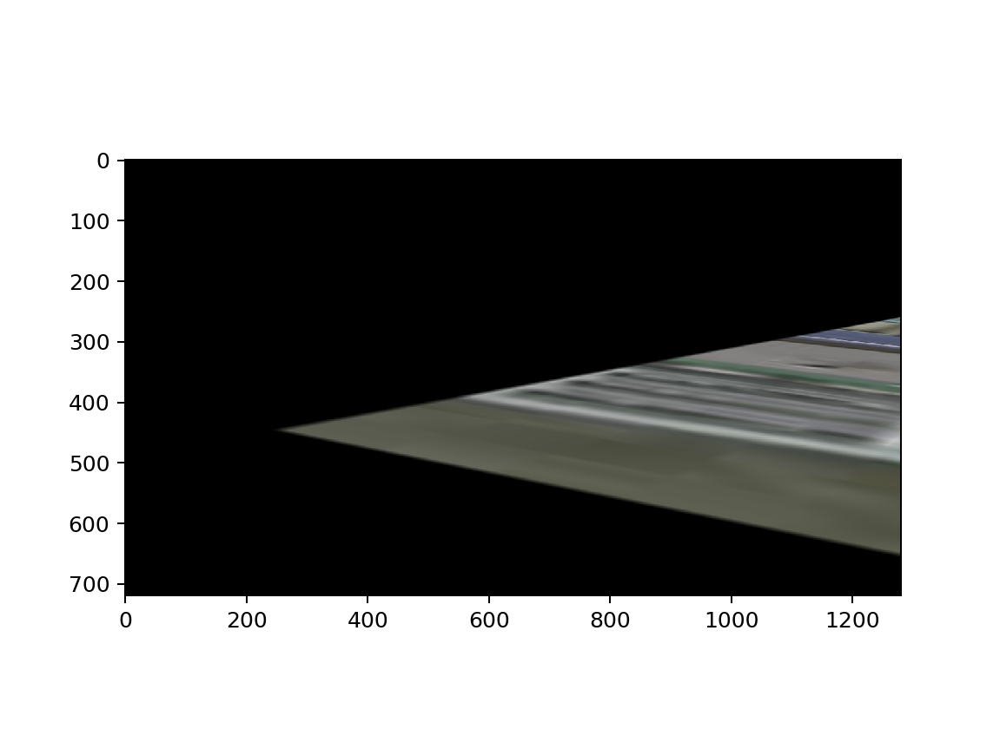

In [331]:
plt.imshow(frame)

<IPython.core.display.Javascript object>


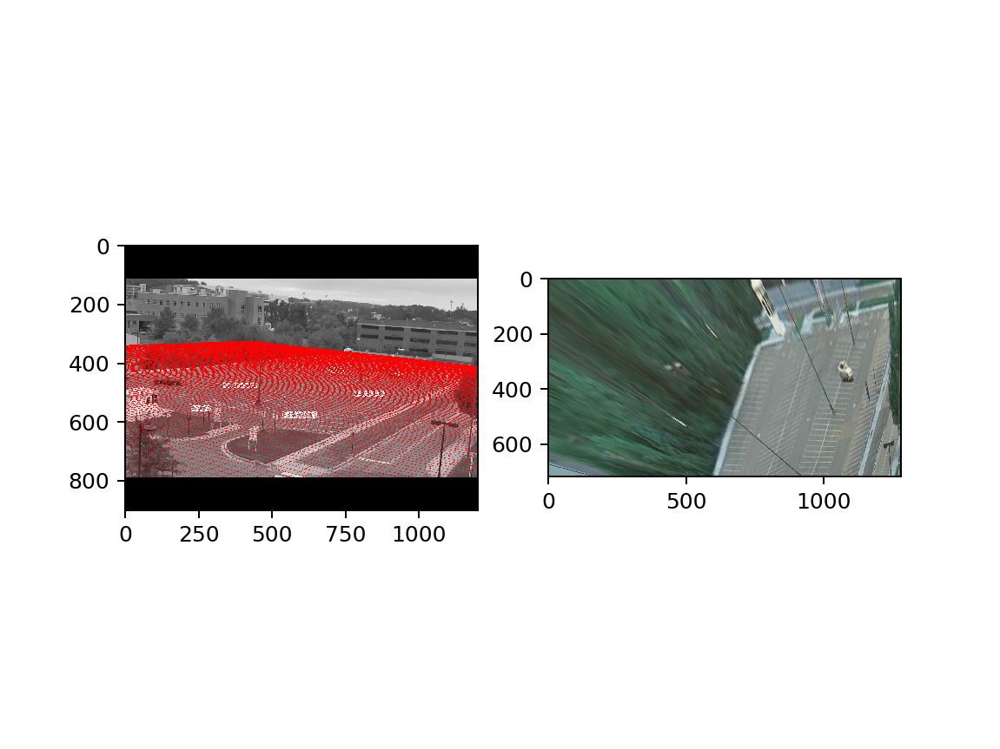

In [363]:
fig, ax = plt.subplots(1,2)
ax[0].imshow(cv2.imread("homographies/VIRAT_0002_homography_img2world.png"))
ax[1].imshow(frame)

In [322]:
H = parse_homography("homographies/VIRAT_0002_homography_img2world.txt")
H

array([[ 2.6480879e-04,  1.4405038e-03, -7.1608763e-01],
       [ 3.5294478e-04, -1.7736213e-03,  6.9800384e-01],
       [-2.0657324e-06,  2.9985304e-05, -1.9978884e-03]])

In [376]:
src2 = np.array([[578, 469], [386, 381], [772, 312], [822, 381]], np.float32)
dst2 = np.array([transform_coords(src2[0][0], src2[0][1], H),
        transform_coords(src2[1][0], src2[1][1], H),
        transform_coords(src2[2][0], src2[2][1], H),
        transform_coords(src2[3][0], src2[3][1], H)], np.float32)

In [377]:
H_est = cv2.getPerspectiveTransform(src2, dst2)

In [374]:
H_inv = np.linalg.inv(H)
H_inv

array([[ 1.63710426e+03,  1.75082910e+03,  2.49139671e+04],
       [ 6.93720919e+01,  1.89102421e+02,  4.12023610e+04],
       [-6.51525904e-01,  1.02785980e+00,  9.20971014e+01]])

In [369]:
# get transformed coordinates
warped_coords = np.zeros((frame.shape[1], frame.shape[0], 2))
minx, miny = float("inf"), float("inf")
maxx, maxy = 0, 0
for x in range(frame.shape[1]):
    for y in range(frame.shape[0]):
        curr = transform_coords(x, y, H_est)
        warped_coords[x][y] = curr
        
        if curr[0] < minx:
            minx = curr[0]
        if curr[0] > maxx:
            maxx = curr[0]
        
        if curr[1] < miny:
            miny = curr[1]
        if curr[1] > maxy:
            maxy = curr[1]

print(minx, miny, maxx, maxy)

-20731892.0 -68770104.0 66112092.0 36443616.0


In [335]:
src = np.array([warped_coords[470][207], warped_coords[1279][315], warped_coords[1279][719], warped_coords[0][241]], np.float32)

In [336]:
dst = np.array([
        [0, 0],
        [frame.shape[1] - 1, 0],
        [frame.shape[1] - 1, frame.shape[0] - 1],
        [0, frame.shape[0] - 1]], dtype = "float32")

In [339]:
H_next = cv2.getPerspectiveTransform(src, dst)
H_next

array([[ 1.43513836e+01,  2.83199466e+00,  8.66082691e+02],
       [-1.82359530e+00, -6.37377247e+00,  8.12506609e+02],
       [ 2.63367594e-03,  6.98010985e-04,  1.00000000e+00]])

<IPython.core.display.Javascript object>


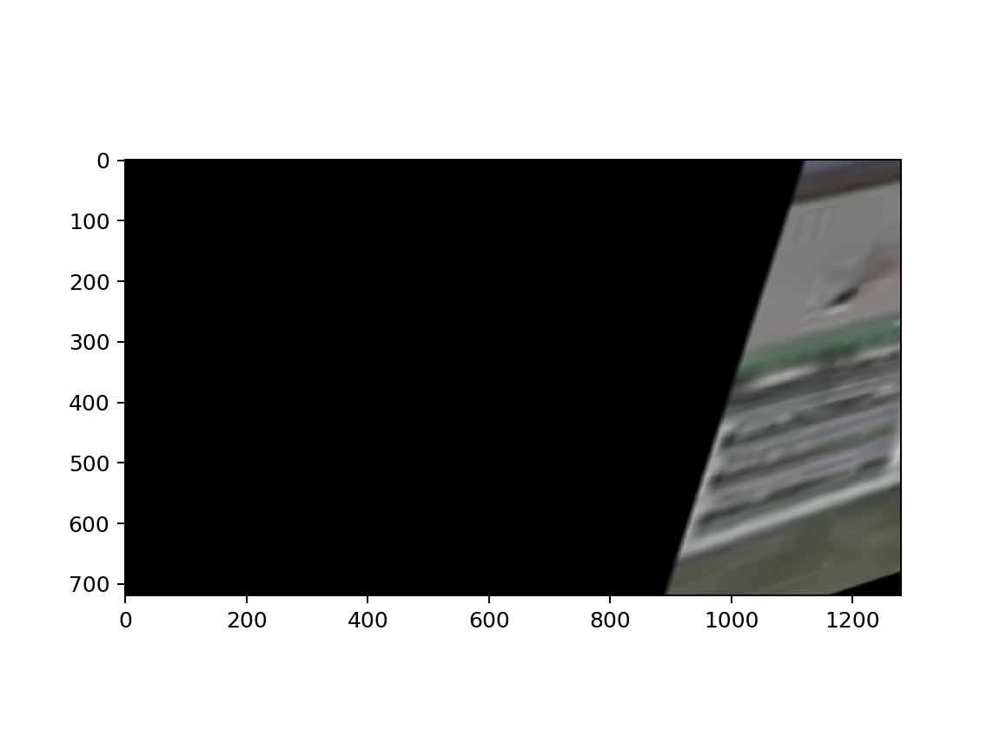

In [361]:
plt.imshow(cv2.warpPerspective(frame.copy(), H_next, (frame.shape[1], frame.shape[0])))

In [359]:
warped_img = np.zeros(frame.shape, dtype=int)
for x in range(frame.shape[1]):
    for y in range(frame.shape[0]): 
        currx = warped_coords[x][y][0]
        curry = warped_coords[x][y][1]
        curr = np.asarray([currx, curry, 1])
        warped = np.matmul(H_next, curr)
        newx = int(warped[0])
        newy = int(warped[1])
        if newx >= 0 and newy >= 0 and newx < frame.shape[1] and newy < frame.shape[0]:
            new_pixel = frame[newy][newx]
            warped_img[y][x] = new_pixel
#         else:
#             warped_img[newy][newx] = [0, 0, 0]

<IPython.core.display.Javascript object>


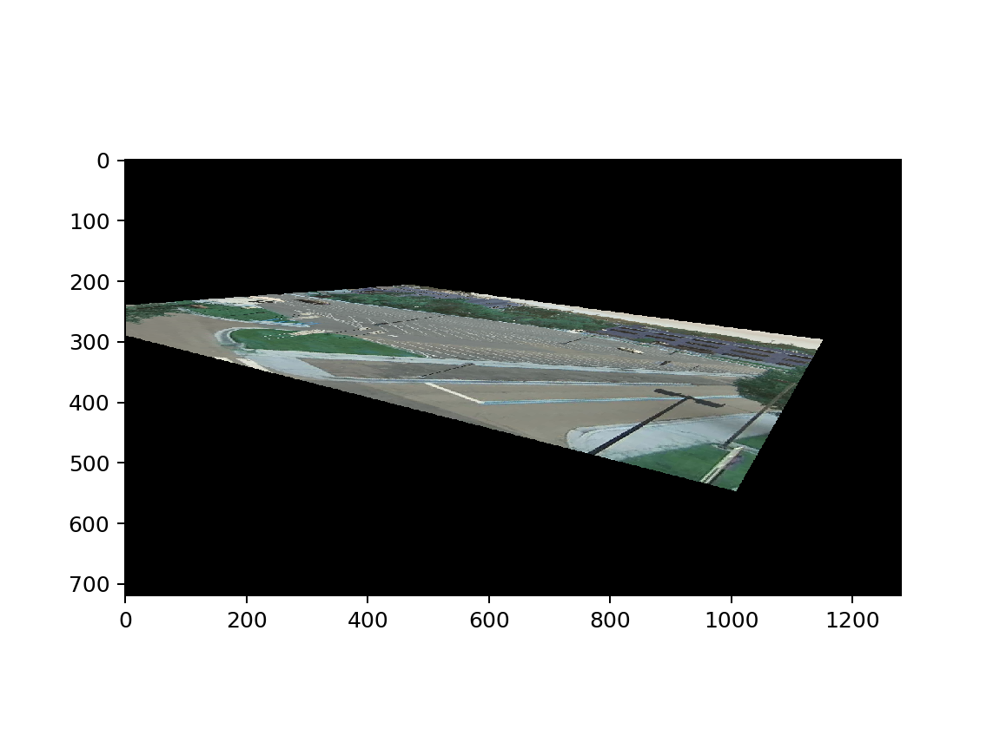

In [360]:
plt.imshow(warped_img)

<IPython.core.display.Javascript object>


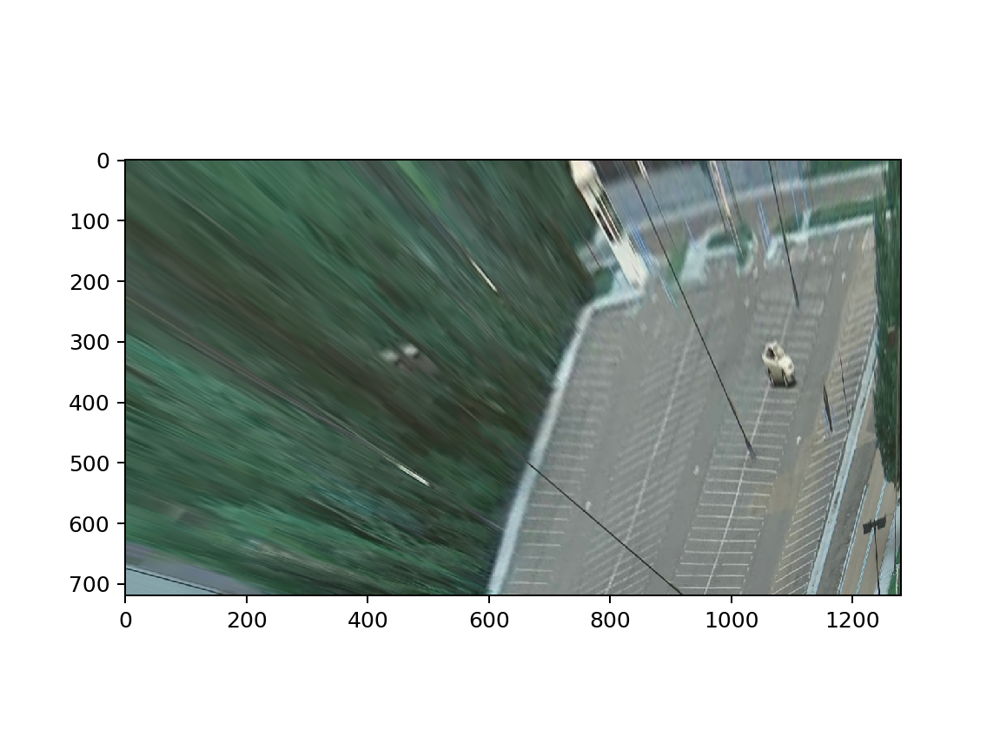

In [378]:
img2wrld = cv2.warpPerspective(frame.copy(), np.matmul(H_next, H_est), (frame.shape[1], frame.shape[0]))
plt.imshow(img2wrld)

<IPython.core.display.Javascript object>


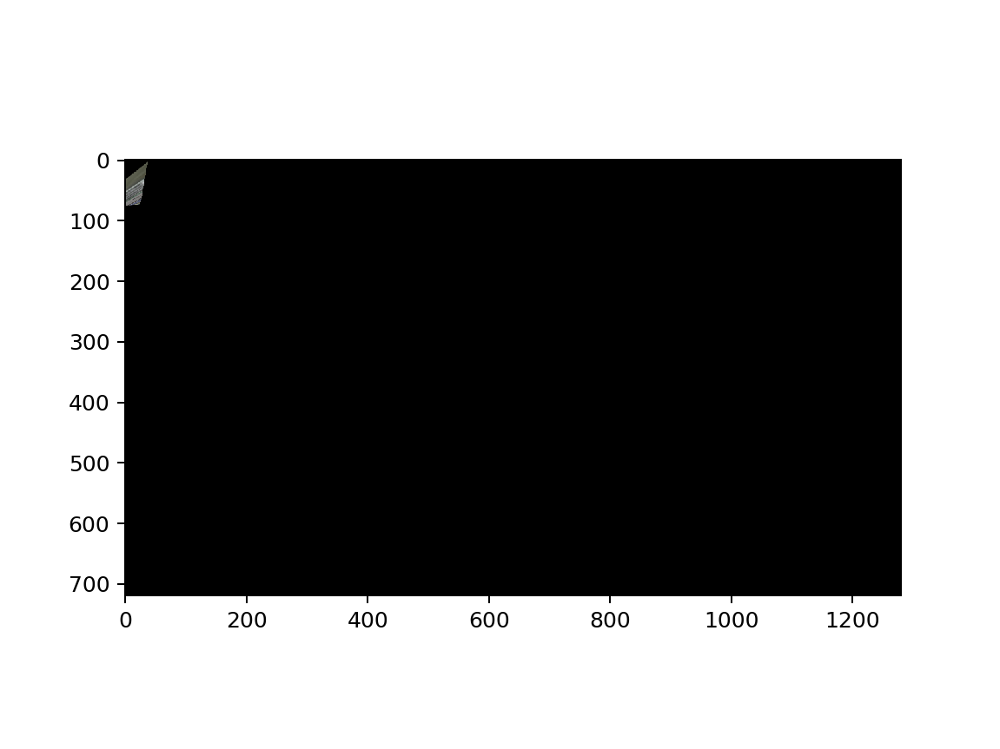

In [344]:
img2wrld2 = cv2.warpPerspective(img2wrld.copy(), np.linalg.inv(H_next), (frame.shape[1], frame.shape[0]))
plt.imshow(img2wrld2)

In [36]:
def transform_coords(x, y, h):
    pt = np.matmul(h, [x, y, 1])
    return np.array([pt[0] / pt[2], pt[1] / pt[2]], np.float32)

In [199]:
tl = transform_coords(0, 0, h)
tr = transform_coords(frame.shape[1], 0, h)
br = transform_coords(frame.shape[1], frame.shape[0], h)
bl = transform_coords(0, frame.shape[0], h)

dst = np.array([tl, tr, br, bl], np.float32)
src = np.array([[0, 0], [frame.shape[1], 0], [frame.shape[1], frame.shape[0]], [0, frame.shape[0]]], np.float32)
M = cv2.getPerspectiveTransform(src, dst)

In [200]:
M

array([[-1.61096387e-02,  5.84315472e-02, -3.08150330e+01],
       [ 3.57109738e-02,  5.16950154e-02, -5.43085327e+01],
       [ 9.65759484e-05,  2.53331824e-03,  1.00000000e+00]])

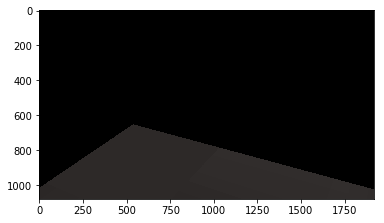

In [201]:
plt.imshow(cv2.warpPerspective(frame.copy(), np.linalg.inv(M), (frame.shape[1], frame.shape[0]), cv2.INTER_CUBIC, cv2.BORDER_CONSTANT))

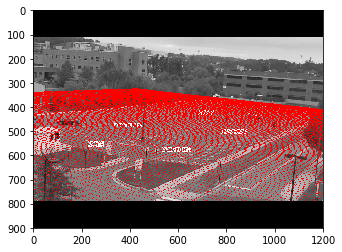

In [202]:
plt.imshow(cv2.imread("VIRAT_0002_homography_img2world.png"))

In [203]:
frame.shape

(1080, 1920, 3)

In [208]:
warped_img = cv2.warpPerspective(frame.copy(), h_inv, (int(frame.shape[1]), int(frame.shape[0])), cv2.INTER_CUBIC, cv2.BORDER_CONSTANT)
# warped_img = np.zeros(frame.shape, dtype=int)
# for x in range(frame.shape[1]):
#     for y in range(frame.shape[0]):        
#         curr = np.asarray([x, y, 1])
#         warped = np.matmul(h_inv, curr)
#         newx = int(warped[0] / warped[2])
#         newy = int(warped[1] / warped[2])
#         if newx >= 0 and newy >= 0 and newx < frame.shape[1] and newy < frame.shape[0]:
#             new_pixel = frame[newy][newx]
#             warped_img[y][x] = new_pixel
# #         else:
# #             warped_img[newy][newx] = [0, 0, 0]

# print(maxx, maxy)

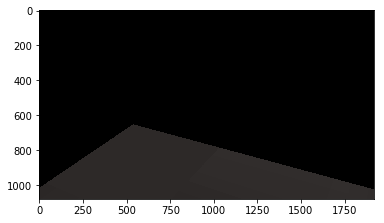

In [209]:
plt.imshow(warped_img)

In [ ]:
rot = cv2.Rodrigues([0, ])

### Testing the scene segmentation model on topdown images
Finding out which warping process produces more accurate segmentation maps.

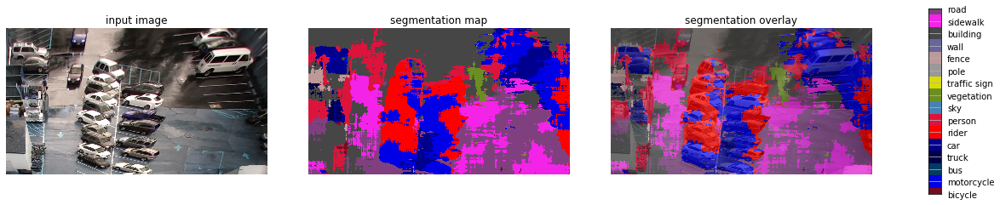

In [125]:
warp1 = Image.fromarray((warps[0]).astype(np.uint8))
seg_map = MODEL.run(warp1)
vis_segmentation(warp1, seg_map)

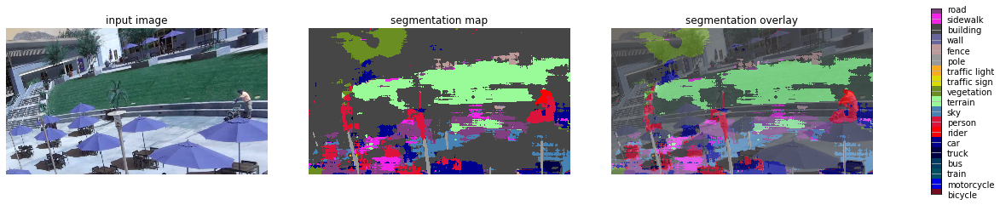

In [126]:
warp2 = Image.fromarray((warps[1]).astype(np.uint8))
seg_map = MODEL.run(warp2)
vis_segmentation(warp2, seg_map)

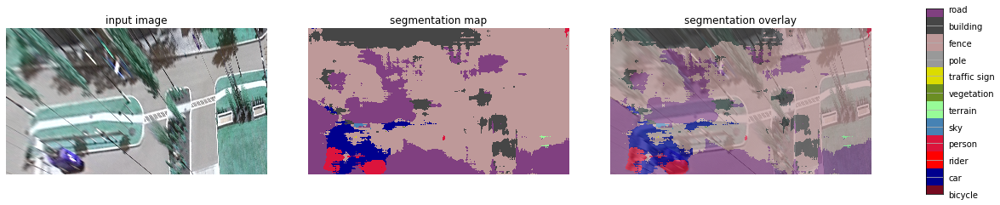

In [127]:
warp3 = Image.fromarray((warps[2]).astype(np.uint8))
seg_map = MODEL.run(warp3)
vis_segmentation(warp3, seg_map)

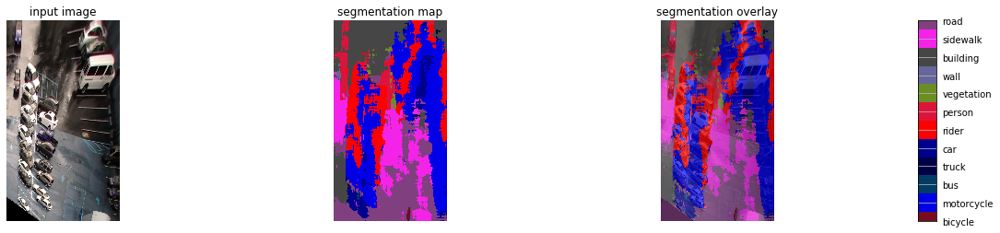

In [238]:
warp2_1 = Image.fromarray((warps2[0]).astype(np.uint8))
seg_map = MODEL.run(warp2_1)
vis_segmentation(warp2_1, seg_map)

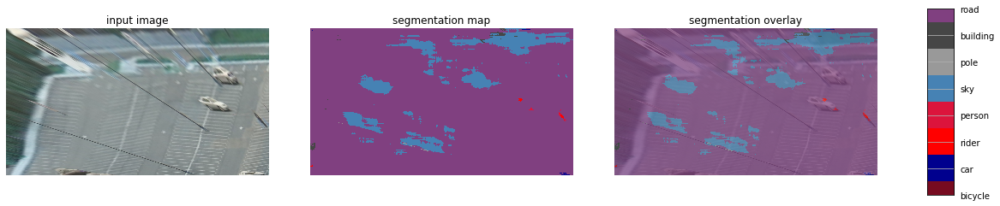

In [259]:
warp2_1 = Image.fromarray((warps[3]).astype(np.uint8))
seg_map = MODEL.run(warp2_1)
vis_segmentation(warp2_1, seg_map)

### Warp and save topdown images of new scenes
VIRAT_S_010004_06_000547_000715  
VIRAT_S_010201_07_000601_000697  
VIRAT_S_050202_00_000000_000105  

In [19]:
import numpy as np
import cv2

In [28]:
fnames = ["VIRAT_S_0100", "VIRAT_S_0102", "VIRAT_S_0502", "VIRAT_S_0001"]
fnames2 = ["VIRAT_0100", "VIRAT_0102", "VIRAT_0502"]

In [29]:
new_imgs = [cv2.resize(cv2.imread("homographies/" + f + ".jpg"), (384, 216)) for f in fnames]

In [30]:
img2world = [cv2.imread("homographies/" + f + "_homography_img2world.png") for f in fnames2]

In [31]:
h_mat = [parse_homography("homographies/" + f + "_homography_img2world.txt") for f in fnames2]

NameError: name 'parse_homography' is not defined

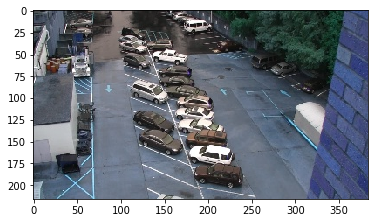

In [32]:
plt.imshow(new_imgs[2])

In [33]:
src = [[0, 0], [14, -10]]
dst = [[240, 312], [851, 399]]

In [37]:
transform_coords(0, 0, np.linalg.inv(h_mat[2]))

NameError: name 'h_mat' is not defined

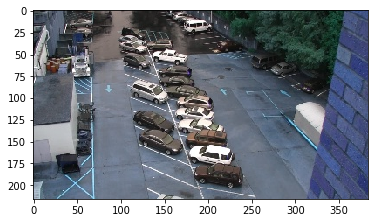

In [38]:
plt.imshow(new_imgs[2])

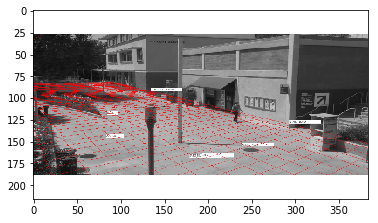

In [39]:
plt.imshow(cv2.resize(img2world[1], (384, 216)))

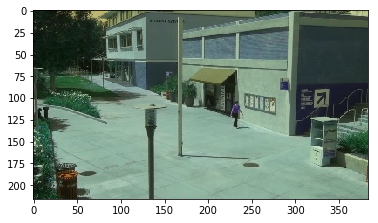

In [40]:
plt.imshow(cv2.resize(new_imgs[1], (384, 216)))

In [41]:
cv2.imwrite("homographies/" + fnames[2] + ".jpg", new_imgs[2])

True

In [42]:
rects = [] # tl, tr, br, bl
rects.append(np.array([(0, 422), (945, 170), (1278, 209), (1279, 719)], dtype="float32"))
rects.append(np.array([(89, 70), (383, 173), (17, 213), (0, 71)], dtype="float32")) 
rects.append(np.array([(212, 8), (383, 137), (26, 215), (14, 16)], dtype="float32")) 

In [43]:
final_warps = []
NUM_IMAGES = len(rects)
final_H = []
for i in range(NUM_IMAGES):
    img = new_imgs[i].copy()
    width, height = len(img[0]), len(img)
    
    dst = np.array([
        [0, 0],
        [width - 1, 0],
        [width - 1, height - 1],
        [0, height - 1]], dtype = "float32")
    
    rect = rects[i]
    
    M = cv2.getPerspectiveTransform(rect, dst)
    final_H.append(M)
    
    final_warps.append(cv2.warpPerspective(img.copy(), M, (width, height)))

In [44]:
import matplotlib.pyplot as plt

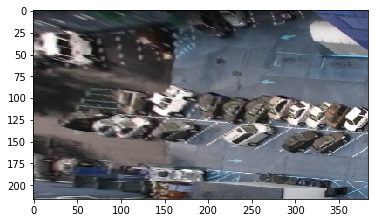

In [45]:
plt.imshow(final_warps[2])

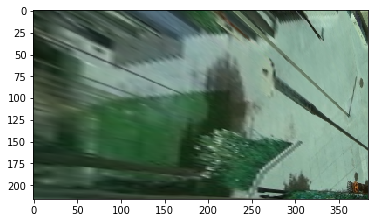

In [46]:
plt.imshow(final_warps[1])

In [1]:
import cv2
import matplotlib.pyplot as plt

In [2]:
%matplotlib notebook

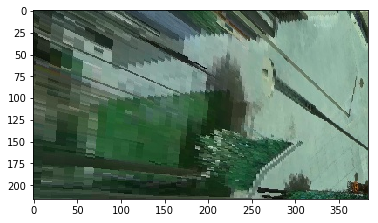

In [47]:
plt.imshow(cv2.imread("topdown/VIRAT_S_010200_00_000060_000218.jpg"))

In [48]:
cv2.imwrite("topdown/" + fnames[1] + "_topdown.png", final_warps[1])

True

In [49]:
cv2.imwrite("topdown/" + fnames[2] + "_topdown.png", final_warps[2])

True

In [50]:
run_visualization("topdown/" + fnames[2] + "_topdown.png")

NameError: name 'run_visualization' is not defined

In [82]:
cv2.imwrite("homographies/" + fnames[2] + ".jpg", new_imgs[2])

True

In [83]:
cv2.imwrite("homographies/" + fnames[1] + ".jpg", new_imgs[1])

True

In [181]:
logits_2 = run_transformed_visualization("homographies/" + fnames[2] + ".jpg", "topdown/" + fnames[2] + "_topdown.png", final_H[2])

[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [2 2 2 ... 0 0 0]
 [2 2 2 ... 0 0 0]
 [2 2 2 ... 0 0 0]]
(216, 384)
(216, 384, 19)


In [182]:
logits_2

array([[[-2.93232656e+00, -3.09841514e+00,  6.15479517e+00, ...,
         -1.92626834e+00, -1.14001298e+00, -8.11156154e-01],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
        ...,
        [ 3.51629734e-01, -1.08595395e+00,  6.72804499e+00, ...,
         -3.46468735e+00, -9.80512500e-01, -1.54215038e+00],
        [ 5.24222016e-01, -9.31582868e-01,  6.69960403e+00, ...,
         -3.44809008e+00, -8.63829851e-01, -1.36203563e+00],
        [ 3.71616781e-01, -9.98981476e-01,  6.56414843e+00, ...,
         -3.45938444e+00, -9.11083579e-01, -1.48391533e+00]],

       [[-2.98073435e+00, -3.17922902e+00,  6.83823681e+00, ...,
         -1.69442368e+00, -1.32626224e+00, -8.27846766e-01],
        [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
          0.00000000e+00,  0.00000000e

In [183]:
logits_1 = run_transformed_visualization("homographies/" + fnames[1] + ".jpg", "topdown/" + fnames[1] + "_topdown.png", final_H[1])

[[8 8 8 ... 2 2 2]
 [8 8 8 ... 2 2 2]
 [8 8 8 ... 2 2 2]
 ...
 [8 8 8 ... 1 1 1]
 [8 8 8 ... 1 1 1]
 [8 8 8 ... 1 1 1]]
(216, 384)
(216, 384, 19)


In [184]:
logits_1

array([[[-1.03605938,  1.62995899,  3.17558432, ..., -2.54183102,
         -1.34817171,  0.68558818],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [-0.40169862,  2.40228462,  5.05268002, ..., -1.74151647,
         -2.96715403, -1.3941251 ],
        [-0.41191745,  2.27890873,  3.40026379, ..., -1.97585034,
         -2.13453579, -1.30057645],
        [-0.83708298,  1.88853192,  3.26672506, ..., -1.95394921,
         -1.86027944, -1.14210045]],

       [[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [-0.10488628,  2.63629365,  4.77041435, ..., -

In [185]:
convertToYML(logits_1, "raw_feat_maps/" + fnames[1] + ".yml")

In [186]:
convertToYML(logits_2, "raw_feat_maps/" + fnames[2] + ".yml")

### Apply warping and segmentation to first frame of videos

In [249]:
from os import listdir
from os.path import isfile, join
final_filenames = [f for f in listdir("new_data") if isfile(join("new_data", f))]
final_filenames = final_filenames[1:]
final_filenames

['VIRAT_S_050200_00_000106_000380.mp4',
 'VIRAT_S_010201_07_000601_000697.mp4',
 'VIRAT_S_010204_01_000072_000225.mp4',
 'VIRAT_S_010206_01_000124_000206.mp4',
 'VIRAT_S_050201_11_002090_002220.mp4',
 'VIRAT_S_010200_00_000060_000218.mp4',
 'VIRAT_S_050202_00_000000_000105.mp4',
 'VIRAT_S_010204_04_000646_000754.mp4',
 'VIRAT_S_050202_07_001126_001301.mp4']

In [250]:
# grab first frames from each image
first_frames = []
for f in final_filenames:
    vidcap = cv2.VideoCapture("new_data/" + f)
    success, image = vidcap.read()
    success = True
    while success:
        first_frames.append(image)
        break

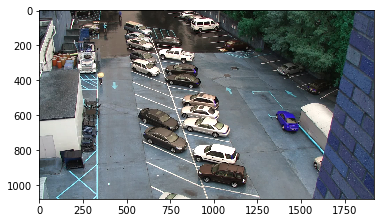

In [251]:
plt.imshow(first_frames[4])

In [252]:
first_frames[0].shape

(1080, 1920, 3)

In [267]:
for i in range(len(first_frames)):
    first_frames[i] = cv2.resize(first_frames[i], (384, 216))

In [268]:
# get feature maps from hog descriptor
hog_maps = []
for i in range(len(first_frames)):
    hog_maps.append(np.resize(get_hog_map(first_frames[i]), (384, 216)))

In [269]:
len(hog_maps)

9

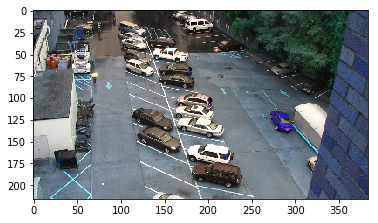

In [270]:
plt.imshow(first_frames[4])

In [271]:
final_warps = []
H = None
for i in range(len(first_frames)):
    im = first_frames[i].copy()
    if final_filenames[i].startswith("VIRAT_S_0502"):
        H = final_H[2]
    else:
        H = final_H[1]
    final_warps.append(cv2.warpPerspective(im, H, (im.shape[1], im.shape[0]), cv2.INTER_CUBIC, cv2.BORDER_CONSTANT ))

In [272]:
final_warps[0].shape

(216, 384, 3)

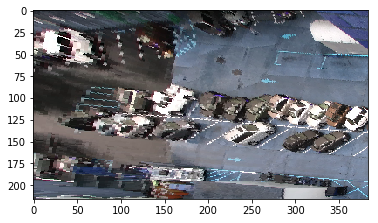

In [259]:
plt.imshow(final_warps[0])

In [273]:
for i in range(len(first_frames)):
    file = final_filenames[i].split(".")[0]
    file = file.split("_")
    stem = file[0] + "_" + file[1] + "_" + file[2]
    stem += "_" + (file[3]) + "_" + str(int(file[4])) + "_" + str(int(file[5])) + "_2_topdown.jpg"
    cv2.imwrite("ioc_demo/walk_imag/" + stem, first_frames[i])

In [274]:
for i in range(len(first_frames)):
    cv2.imwrite("first_frames/" + final_filenames[i].split(".")[0] + ".jpg", first_frames[i])

In [275]:
for i in range(len(first_frames)):
    cv2.imwrite("topdown/" + final_filenames[i].split(".")[0] + ".jpg", final_warps[i])

In [263]:
logits = []
H = None
for i in range(len(first_frames)): 
    if final_filenames[i].startswith("VIRAT_S_0502"):
        H = final_H[2]
    else:
        H = final_H[1]
    logits.append(run_transformed_visualization("first_frames/" + final_filenames[i].split(".")[0] + ".jpg", "topdown/" + final_filenames[i].split(".")[0] + ".jpg", H))

(216, 384)
(216, 384, 19)
(216, 384)
(216, 384, 19)
(216, 384)
(216, 384, 19)
(216, 384)
(216, 384, 19)
(216, 384)
(216, 384, 19)
(216, 384)
(216, 384, 19)
(216, 384)
(216, 384, 19)
(216, 384)
(216, 384, 19)
(216, 384)
(216, 384, 19)


In [264]:
logits[0]

array([[[-2.6158793 , -3.33409429,  6.17875624, ..., -1.71292698,
         -1.77312291, -1.40126848],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 1.15875912, -1.47993433,  6.92881823, ..., -3.59058905,
         -0.86039615, -1.85267293],
        [ 1.30929732, -1.44098306,  6.73034573, ..., -3.62499976,
         -0.75751281, -1.83298695],
        [ 1.25705028, -1.38949239,  6.67782211, ..., -3.63824487,
         -0.76115203, -1.80416393]],

       [[-2.74989843, -3.58288026,  6.36960983, ..., -1.64382672,
         -1.68812847, -1.37921739],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  

In [277]:
logits[0].shape

(216, 384, 19)

In [279]:
# save YML files
for i in range(len(logits)):
    convertToYML(logits[i], "yml_files/" + final_filenames[i].split(".")[0] + "_features.yml")

## Pedestrian Detection
Code sourced from: https://towardsdatascience.com/pedestrian-detection-using-non-maximum-suppression-b55b89cefc6

In [3]:
def overlapping_area(detection_1, detection_2):
    x1_tl = detection_1[0]
    x2_tl = detection_2[0]
    x1_br = detection_1[0] + detection_1[3]
    x2_br = detection_2[0] + detection_2[3]
    y1_tl = detection_1[1]
    y2_tl = detection_2[1]
    y1_br = detection_1[1] + detection_1[4]
    y2_br = detection_2[1] + detection_2[4]
    # Calculate the overlapping Area
    x_overlap = max(0, min(x1_br, x2_br)-max(x1_tl, x2_tl))
    y_overlap = max(0, min(y1_br, y2_br)-max(y1_tl, y2_tl))
    overlap_area = x_overlap * y_overlap
    area_1 = detection_1[3] * detection_2[4]
    area_2 = detection_2[3] * detection_2[4]
    total_area = area_1 + area_2 - overlap_area
    return overlap_area / float(total_area)

In [17]:
def nms(detections, threshold=.5):
   
    detections = sorted(detections, key=lambda detections: detections[2],
            reverse=True)
    
    new_detections=[]
    
    new_detections.append(detections[0])
    
    del detections[0]
    
    for index, detection in enumerate(detections):
        for new_detection in new_detections:
            if overlapping_area(detection, new_detection) > threshold:
                del detections[index]
                break
        else:
            new_detections.append(detection)
            del detections[index]
    return new_detections

In [345]:
!pip install scikit-image

     |████████████████████████████████| 30.3MB 880kB/s eta 0:00:01    |██████▋                         | 6.2MB 144kB/s eta 0:02:47     |███████████▏                    | 10.5MB 140kB/s eta 0:02:21
     |████████████████████████████████| 4.3MB 1.0MB/s eta 0:00:01
  Using cached https://files.pythonhosted.org/packages/1a/de/f7f985018f462ceeffada7f6e609919fbcc934acd9301929cba14bc2c24a/imageio-2.6.1-py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/41/8f/dd6a8e85946def36e4f2c69c84219af0fa5e832b018c970e92f2ad337e45/networkx-2.4-py3-none-any.whl


In [348]:
!pip install nms

In [5]:
import time
from skimage.feature import hog
from sklearn.externals import joblib
from nms import nms
import argparse

/Users/uuberoy/miniconda3/envs/cos429/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


In [6]:
def appendRects(i, j, conf, c, rects):
    x = int((j)*pow(scaleFactor, c))
    y = int((i)*pow(scaleFactor, c))
    w = int((64)*pow(scaleFactor, c))
    h = int((128)*pow(scaleFactor, c))
    rects.append((x, y, conf, w, h))

In [19]:
clf = joblib.load("pedestrian.pkl")
orig = image_resize(cv2.imread("sample5.png"), width=600)
img = orig.copy()
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
scaleFactor = 1.2
inverse = 1.0/scaleFactor
winStride = (4, 4)
winSize = (128, 64)

/Users/uuberoy/miniconda3/envs/cos429/lib/python3.7/site-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator LinearSVC from version 0.20.2 when using version 0.22. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


In [14]:
visualize = False

In [ ]:
rects = []

h, w = gray.shape
count = 0
while (h >= 128 and w >= 64):

    print (gray.shape)

    h, w= gray.shape
    horiz = w - 64
    vert = h - 128
    print (horiz, vert)
    i = 0
    j = 0
    while i < vert:
        j = 0
        while j < horiz:

            portion = gray[i:i+winSize[0], j:j+winSize[1]]
            features = hog(portion, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), block_norm="L2")

            result = clf.predict([features])

            if visualize:
                visual = gray.copy()
                cv2.rectangle(visual, (j, i), (j+winSize[1], i+winSize[0]), (0, 0, 255), 2)
                cv2.imshow("visual", visual)
                cv2.waitKey(1)

            if int(result[0]) == 1:
                # print (result, i, j)
                confidence = clf.decision_function([features])
                appendRects(i, j, confidence, count, rects)


            j = j + winStride[0]

        i = i + winStride[1]

    gray = cv2.resize(gray, (int(w*inverse), int(h*inverse)), interpolation=cv2.INTER_AREA)
    count = count + 1
    # print (count)

print (rects)

(338, 600)
536 210
(281, 500)
436 153


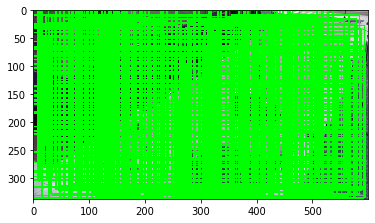

In [18]:
nms_threshold = 0.7
nms_rects = nms(rects, nms_threshold)
for (a, b, conf, c, d) in rects:
    cv2.rectangle(orig, (a, b), (a+c, b+d), (0, 255, 0), 2)
plt.imshow(orig)

In [ ]:
for (a, b, conf, c, d) in nms_rects:
    cv2.rectangle(img, (a, b), (a+c, b+d), (0, 255, 0), 2)
plt.imshow(img)

Note - try another pedestrian detection method

### Simpler method using OpenCV's inbuilt HOG Detector
Small inaccuracies in detection are fine because these observed trajectories are used in computing the noise in the observations when compared to the gt trajectories

In [64]:
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

In [322]:
def find_people(image):    
    boxes, weights = hog.detectMultiScale(image, winStride=(4,4) )
    boxes = np.array([[x, y, x + w, y + h] for (x, y, w, h) in boxes])
    
#     for (a, b, c, d) in boxes:
#         cv2.rectangle(image, (a, b), (c, d), (0, 255, 0), 2)
    
#     plt.imshow(image)
    return boxes

In [112]:
def get_hog_map(image):
    h = hog.compute(im)
    return h

In [230]:
find_people("sample5.png")

TypeError: Expected Ptr<cv::UMat> for argument '%s'

In [231]:
find_people("sample6.png")

TypeError: Expected Ptr<cv::UMat> for argument '%s'

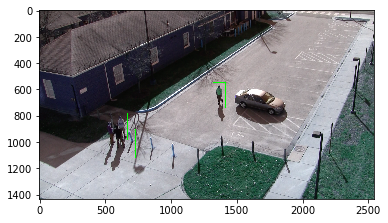

In [25]:
find_people("sample7.png")

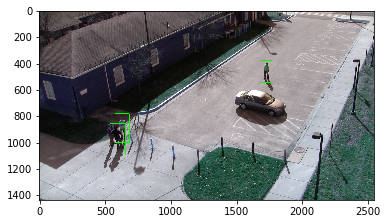

In [26]:
find_people("sample8.png")

The results are pretty reasonable -- we have a sketch of a bounding box on most of the people in each scene. With these bounding box coordinates, I can then proceed to find the pertinent bounding box by choosing the box closest to the gt bounding box in any given frame.

1900 476 72 144
2183 428 94 187
2163 355 135 270


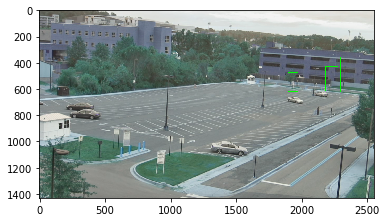

In [29]:
find_people("sample4.png")

2257 627 77 153
230 378 115 230
241 226 121 241
2217 623 147 293


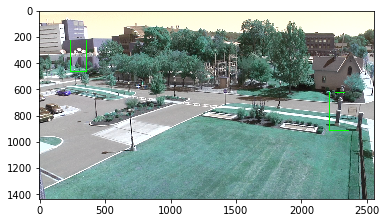

In [30]:
find_people("sample3.png")

624 832 72 145
1771 1224 74 148
2387 91 68 136
621 878 86 172
2117 354 116 231
118 636 122 245


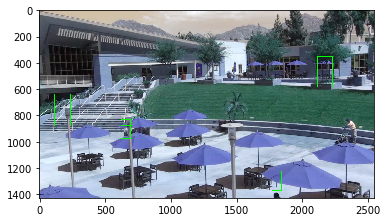

In [31]:
find_people("sample2.png")

array([[ 995,   60, 1076,  222],
       [ 576,  494,  652,  647],
       [ 624,  507,  694,  647],
       [ 931,   50, 1015,  219],
       [1606,  759, 1753, 1053],
       [1163,  536, 1279,  769],
       [  84,  402,  220,  673],
       [1242,  727, 1426, 1096],
       [ 779,  672, 1004, 1122]], dtype=int32)

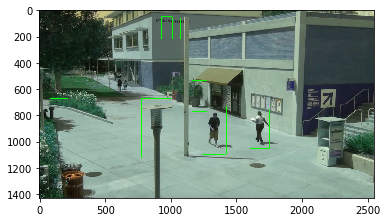

In [320]:
find_people(cv2.imread("sample10.png"))

### Load GT Trajectories
from VIRAT object annotations  
File format:
[obj_id] [duration] [frame] [topleft_x] [topleft_y] [w] [h] [obj_type]  

The object types are:  
1: person  
2: car              (usually passenger vehicles such as sedan, truck)  
3: vehicles         (vehicles other than usual passenger cars. Examples include construction vehicles)  
4: object           (neither car or person, usually carried objects)  
5: bike, bicylces   (may include engine-powered auto-bikes)  

In [15]:
import pandas as pd

In [66]:
# read in gt trajectory files into list
gt_filenames = [f for f in listdir("gt_traj") if isfile(join("gt_traj", f))]
gt_filenames.remove('.DS_Store')
gt_filenames.sort()
gt_filenames

['VIRAT_S_010200_00_000060_000218.viratdata.objects.txt',
 'VIRAT_S_010201_07_000601_000697.viratdata.objects.txt',
 'VIRAT_S_010204_01_000072_000225.viratdata.objects.txt',
 'VIRAT_S_010204_04_000646_000754.viratdata.objects.txt',
 'VIRAT_S_010206_01_000124_000206.viratdata.objects.txt',
 'VIRAT_S_050200_00_000106_000380.viratdata.objects.txt',
 'VIRAT_S_050201_11_002090_002220.viratdata.objects.txt',
 'VIRAT_S_050202_00_000000_000105.viratdata.objects.txt',
 'VIRAT_S_050202_07_001126_001301.viratdata.objects.txt']

In [67]:
gt = []
for i in range(len(gt_filenames)):
    gt.append(pd.read_csv('gt_traj/' + gt_filenames[i], sep=" ", header=None))

In [68]:
gt[0]

,0,1,2,3,4,5,6,7
0,0,444,3282,320,234,16,34,1
1,0,444,3283,318,234,16,34,1
2,0,444,3284,318,234,16,34,1
3,0,444,3285,316,234,16,34,1
4,0,444,3286,316,234,16,34,1
...,...,...,...,...,...,...,...,...
21786,38,95,1817,958,465,34,23,4
21787,38,95,1818,958,465,34,23,4
21788,38,95,1819,958,465,34,23,4
21789,38,95,1820,958,465,34,23,4


In [69]:
len(gt)

9

In [70]:
# gather list of (x, y) coordinates for ground truth trajectories, given a starting second
def find_traj(start, end, data):
    trajectories = {}
    
    for index, row in data.iterrows():
        obj_id = row[0]
        duration = row[1]
        frame = row[2]
        topleft_x = row[3]
        topleft_y = row[4]
        w = row[5]
        h = row[6]
        obj_type = row[7]
        
        time = frame / 30.0
        br_x = topleft_x + w # bottomleft for footfall
        br_y = topleft_y + h

        # if person
        if obj_type == 1 and time >= start and time <= end:
            if obj_id not in trajectories:
                trajectories[obj_id] = [[br_x, br_y]]
            elif obj_id in trajectories:
                trajectories[obj_id].append([br_x, br_y])
            
    return trajectories

In [ ]:
def draw_bbox(frame, data, img):    
    for index, row in data.iterrows():
        obj_id = row[0]
        duration = row[1]
        curr_frame = row[2]
        topleft_x = row[3]
        topleft_y = row[4]
        w = row[5]
        h = row[6]
        obj_type = row[7]
        
        if curr_frame == frame:
            cv2.rectangle()
        br_x = topleft_x + w # bottomleft for footfall
        br_y = topleft_y + h

        # if person
        if obj_type == 1 and time >= start and time <= end:
            if obj_id not in trajectories:
                trajectories[obj_id] = [[br_x, br_y]]
            elif obj_id in trajectories:
                trajectories[obj_id].append([br_x, br_y])
            
    return trajectories

In [71]:
gt_traj = [find_traj(59, 84, gt[0]),
           find_traj(7, 32, gt[1]),
           find_traj(17, 51, gt[2]),
           find_traj(65, 88, gt[3]),
           find_traj(11, 26, gt[4]),
           find_traj(163, 191, gt[5]),
           find_traj(59, 94, gt[6]),
           find_traj(34, 93, gt[7]),
           find_traj(30, 39, gt[8])]

In [72]:
gt_traj_updated = []
for i in range(9):
    gt_traj_shortened = []
    max_len = 0
    for obj_id in gt_traj[i]:
        if len(gt_traj[i][obj_id]) > max_len:
            max_len = len(gt_traj[i][obj_id])
    
    for obj_id in gt_traj[i]:
        if len(gt_traj[i][obj_id]) == max_len:
            gt_traj_shortened = gt_traj[i][obj_id]
            break
    
    gt_traj_updated.append(gt_traj_shortened)

In [73]:
for i in range(9):
    print(i, len(gt_traj_updated[i]))

0 751
1 751
2 1021
3 624
4 451
5 525
6 432
7 1742
8 271


In [74]:
def transform_trajectories(traj, H, w, h):
    transformed_traj = []
    for i in range(len(traj)):
        [x, y] = traj[i]
        rx = 384 / 1280.0
        ry = 216 / 720.0
        
        newx, newy = transform_coords(rx * x, ry * y, H)
        newx, newy = int(newx), int(newy)
        
        if newx < 0 or newy < 0 or newx >= w or newy >= h:
            transformed_traj.append([0, 0])
        else:
            transformed_traj.append([newx, newy])
    
    return transformed_traj

In [75]:
def transform_trajectories_obs(traj, H, w, h):
    transformed_traj = []
    for i in range(len(traj)):
        [x, y] = traj[i]
        
        newx, newy = transform_coords(x, y, H)
        newx, newy = int(newx), int(newy)
        
        if newx < 0 or newy < 0 or newx >= w or newy >= h:
            transformed_traj.append([0, 0])
        else:
            transformed_traj.append([newx, newy])
    
    return transformed_traj

In [76]:
gt_traj_transformed = []
H = None
for i in range(9):
    if gt_filenames[i].startswith("VIRAT_S_0502"):
        H = final_H[2]
    else:
        H = final_H[1]
    
    w = 384
    h = 216
    
    gt_traj_transformed.append(transform_trajectories(gt_traj_updated[i], H, w, h))

In [77]:
gt_traj_transformed

[[[236, 77],
  [234, 76],
  [234, 76],
  [234, 76],
  [234, 76],
  [234, 76],
  [234, 76],
  [234, 76],
  [234, 76],
  [234, 76],
  [234, 76],
  [232, 75],
  [232, 75],
  [232, 75],
  [232, 76],
  [232, 76],
  [232, 76],
  [232, 76],
  [232, 76],
  [232, 76],
  [232, 76],
  [231, 77],
  [231, 77],
  [231, 77],
  [231, 77],
  [231, 77],
  [231, 77],
  [231, 77],
  [231, 77],
  [231, 77],
  [231, 77],
  [229, 76],
  [229, 76],
  [229, 76],
  [229, 76],
  [229, 77],
  [229, 77],
  [229, 77],
  [227, 75],
  [227, 75],
  [226, 76],
  [226, 76],
  [226, 76],
  [226, 76],
  [226, 76],
  [225, 76],
  [225, 76],
  [225, 76],
  [225, 76],
  [225, 76],
  [225, 77],
  [225, 77],
  [223, 75],
  [223, 75],
  [222, 76],
  [222, 76],
  [222, 76],
  [222, 76],
  [222, 76],
  [220, 75],
  [220, 75],
  [220, 75],
  [220, 75],
  [220, 75],
  [220, 76],
  [220, 76],
  [217, 74],
  [217, 74],
  [217, 74],
  [217, 75],
  [217, 75],
  [217, 75],
  [217, 75],
  [217, 75],
  [216, 75],
  [216, 75],
  [216, 75],

In [78]:
del gt_traj_transformed[7] # due to lack of valid, inbounds data
del gt_filenames[7]

In [79]:
gt_filenames

['VIRAT_S_010200_00_000060_000218.viratdata.objects.txt',
 'VIRAT_S_010201_07_000601_000697.viratdata.objects.txt',
 'VIRAT_S_010204_01_000072_000225.viratdata.objects.txt',
 'VIRAT_S_010204_04_000646_000754.viratdata.objects.txt',
 'VIRAT_S_010206_01_000124_000206.viratdata.objects.txt',
 'VIRAT_S_050200_00_000106_000380.viratdata.objects.txt',
 'VIRAT_S_050201_11_002090_002220.viratdata.objects.txt',
 'VIRAT_S_050202_07_001126_001301.viratdata.objects.txt']

## Generate Observed Trajectories

In [80]:
# Euclidean distance between two points
import math
def distance(p1, p2):
     return ((p1[0]-p2[0])**2)+((p1[1]-p2[1])**2)

In [81]:
# read in gt trajectory files into list
vid_filenames = [f for f in listdir("new_data") if isfile(join("new_data", f))]
vid_filenames.remove('.DS_Store')
vid_filenames.sort()
vid_filenames

['VIRAT_S_010200_00_000060_000218.mp4',
 'VIRAT_S_010201_07_000601_000697.mp4',
 'VIRAT_S_010204_01_000072_000225.mp4',
 'VIRAT_S_010204_04_000646_000754.mp4',
 'VIRAT_S_010206_01_000124_000206.mp4',
 'VIRAT_S_050200_00_000106_000380.mp4',
 'VIRAT_S_050201_11_002090_002220.mp4',
 'VIRAT_S_050202_00_000000_000105.mp4',
 'VIRAT_S_050202_07_001126_001301.mp4']

In [82]:
del vid_filenames[8]

In [83]:
vid_filenames

['VIRAT_S_010200_00_000060_000218.mp4',
 'VIRAT_S_010201_07_000601_000697.mp4',
 'VIRAT_S_010204_01_000072_000225.mp4',
 'VIRAT_S_010204_04_000646_000754.mp4',
 'VIRAT_S_010206_01_000124_000206.mp4',
 'VIRAT_S_050200_00_000106_000380.mp4',
 'VIRAT_S_050201_11_002090_002220.mp4',
 'VIRAT_S_050202_00_000000_000105.mp4']

In [247]:
# all_frames = []
# for i in range(len(gt_filenames)):
#     vidcap = cv2.VideoCapture("new_data/" + vid_filenames[i])
#     success, image = vidcap.read()
#     frames = []
#     success = True
#     while success:
#         frames.append(image)     # save frame     
#         success,image = vidcap.read()
    
#     all_frames.append(frames)

In [248]:
# print(all_frames[0])

In [165]:
def find_observed_traj(start, end, gt_traj, th, idx):
    # Read in video
    vid = cv2.VideoCapture("new_data/" + vid_filenames[idx])
    frames =  int(vid.get(cv2.CAP_PROP_FRAME_COUNT))
    width = int(vid.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(vid.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total_frames = vid.get(7)
    fps = 30
    
    obs_traj = []
    startframe, endframe = start * fps, end * fps
    ctr = 0
    
    rx = 384 / 1280.0
    ry = 216 / 720.0
    for i in range(startframe, endframe):
        if i >= len(gt_traj) + startframe:
            print("entered break", i, len(gt_traj))
            break
        
        vid.set(1, i)
        ret, frame = vid.read()
#         frame = cv2.resize(frame, (384, 216))
        bboxes = find_people(frame)
        
        if i == int(0.25 * (endframe - startframe)):
            print("1/4 Complete")
        
        elif i == int(0.5 * (endframe - startframe)):
            print("2/4 Complete")
        
        elif i == int(0.75 * (endframe - startframe)):
            print("3/4 Complete")
        
        # find closest bbox to ground truth for this frame
        min_dist = float("inf")
        closest = [0, 0] # br point
        gt_bbox = [gt_traj[i - startframe][0] * rx, gt_traj[i - startframe][1] * ry]
        for b in bboxes:
            obs_bbox = [b[0] * rx, b[1] * ry] # br coords
            
            if abs(obs_bbox[0] - gt_bbox[0]) > th or abs(obs_bbox[1] - gt_bbox[1]) > th:
                continue
                    
            dist = distance(obs_bbox, gt_bbox)
            if dist < min_dist:
                min_dist = dist
                closest = obs_bbox
        
        # print(closest)
        obs_traj.append(closest)
                
    return obs_traj

In [285]:
test = find_observed_traj(59, 84, gt_traj_updated[0], 50, 0)

[117.6, 101.1]
[117.6, 101.1]
[117.6, 101.1]
[117.6, 101.1]
[117.6, 101.1]


KeyboardInterrupt: 

In [291]:
test_transformed = transform_trajectories_obs(test, final_H[1], 384, 216)

In [292]:
test_transformed

[[238, 75],
 [238, 75],
 [238, 75],
 [238, 75],
 [238, 75],
 [238, 75],
 [238, 75],
 [239, 76],
 [239, 76],
 [239, 76],
 [239, 76],
 [239, 76],
 [239, 76],
 [239, 76],
 [239, 76],
 [239, 76],
 [238, 75],
 [238, 75],
 [238, 75],
 [238, 75],
 [238, 75],
 [238, 75],
 [238, 75],
 [238, 75],
 [238, 75],
 [238, 75],
 [238, 75],
 [239, 76],
 [239, 76],
 [239, 76],
 [239, 76],
 [239, 76],
 [239, 76],
 [239, 76],
 [238, 76],
 [238, 76],
 [238, 76],
 [238, 76],
 [238, 76],
 [238, 76],
 [238, 76],
 [238, 76],
 [238, 76],
 [238, 76],
 [238, 76],
 [238, 75],
 [238, 75],
 [239, 76],
 [239, 76],
 [239, 76],
 [239, 76],
 [239, 76],
 [239, 76],
 [240, 76],
 [240, 76],
 [240, 76],
 [240, 76],
 [240, 76],
 [240, 76],
 [240, 76],
 [240, 76],
 [240, 76],
 [240, 76],
 [240, 76],
 [241, 77],
 [241, 77],
 [241, 77],
 [241, 77],
 [241, 77],
 [241, 77],
 [241, 77],
 [241, 77],
 [241, 77],
 [241, 77],
 [241, 77],
 [241, 77],
 [241, 77],
 [241, 77],
 [241, 77],
 [241, 77],
 [240, 76],
 [240, 76],
 [240, 76],
 [24

In [293]:
len(test_transformed)

750

In [294]:
len(gt_traj_transformed[0])

750

In [279]:
del gt_traj_transformed[0][750]

In [280]:
len(gt_traj_transformed[0])

750

In [295]:
write_traj_to_file(test_transformed, "3D_foot_obs/" + gt_filenames[0].split(".")[0] + "_3D_foot_obs.txt")

In [296]:
write_traj_to_file(gt_traj_transformed[0], "3D_foot_gt/" + gt_filenames[0].split(".")[0] + "_3D_foot_gt.txt")

In [280]:
test2 = find_observed_traj(7, 32, gt_traj_updated[1], 50, 1)

2/4 Complete
3/4 Complete


In [282]:
len(test2), len(gt_traj_updated[1])

(750, 751)

In [284]:
del gt_traj_updated[1][750]

In [285]:
test2_transformed = transform_trajectories_obs(test2, final_H[1], 384, 216)

In [286]:
test2_transformed

[[247, 79],
 [247, 79],
 [247, 79],
 [247, 79],
 [247, 79],
 [249, 80],
 [247, 79],
 [247, 79],
 [247, 79],
 [248, 80],
 [248, 80],
 [248, 80],
 [248, 80],
 [252, 82],
 [254, 83],
 [256, 84],
 [256, 84],
 [256, 84],
 [249, 80],
 [253, 82],
 [253, 82],
 [253, 82],
 [253, 82],
 [251, 81],
 [251, 81],
 [252, 82],
 [249, 80],
 [252, 82],
 [251, 81],
 [251, 81],
 [225, 69],
 [232, 72],
 [236, 74],
 [246, 79],
 [246, 79],
 [246, 79],
 [246, 79],
 [246, 79],
 [246, 79],
 [246, 79],
 [244, 78],
 [244, 78],
 [244, 78],
 [244, 78],
 [244, 78],
 [244, 78],
 [244, 78],
 [244, 78],
 [249, 80],
 [249, 80],
 [246, 79],
 [246, 79],
 [246, 79],
 [248, 80],
 [248, 80],
 [248, 80],
 [248, 80],
 [248, 80],
 [248, 80],
 [247, 79],
 [247, 79],
 [248, 80],
 [249, 80],
 [249, 80],
 [248, 80],
 [249, 80],
 [248, 79],
 [247, 79],
 [248, 80],
 [249, 80],
 [249, 80],
 [244, 78],
 [244, 78],
 [246, 79],
 [244, 78],
 [248, 80],
 [248, 80],
 [248, 80],
 [248, 80],
 [249, 80],
 [250, 81],
 [250, 81],
 [248, 80],
 [24

In [308]:
interp_gt2, interp_obs2 = interpolate_traj(gt_traj_transformed[1], test2_transformed)

In [309]:
len(interp_gt2), len(interp_obs2)

(1785, 1785)

In [310]:
normalized_gt2 = normalize_traj(interp_gt2)
normalized_obs2 = normalize_traj(interp_obs2)

In [311]:
write_traj_to_file(normalized_obs2, "3D_foot_obs/" + gt_filenames[1].split(".")[0] + "_3D_foot_obs.txt")
write_traj_to_file(normalized_gt2, "3D_foot_gt/" + gt_filenames[1].split(".")[0] + "_3D_foot_gt.txt")

In [306]:
def interpolate_traj(gt, obs):
    new_gt_traj = []
    new_obs_traj = []

    for i in range(len(gt) - 1):
        x1, y1 = gt[i][0], gt[i][1]
        x2, y2 = gt[i+1][0], gt[i+1][1]

        # append first set of points
        new_gt_traj.append([x1, y1])
        new_obs_traj.append([obs[i][0], obs[i][1]])

        diffx = x2 - x1
        diffy = y2 - y1

        # keep the value of y static while appending incrementing / decrementing x's
        if abs(diffx) > 0:
            if x1 < x2:
                currx = x1 + 1
                while currx <= x2:
                    new_gt_traj.append([currx, y1])
                    new_obs_traj.append([obs[i][0], obs[i][1]])
                    currx += 1
            elif x2 < x1:
                currx = x1 - 1
                while currx >= x2:
                    new_gt_traj.append([currx, y1])
                    new_obs_traj.append([obs[i][0], obs[i][1]])
                    currx -= 1

        # keep the value of x static while appending incrementing / decrementing y's
        if abs(diffy) > 0:
            if y1 < y2:
                curry = y1 + 1
                while curry <= y2:
                    new_gt_traj.append([x2, curry])
                    new_obs_traj.append([obs[i][0], obs[i][1]])
                    curry += 1
            elif y2 < y1:
                curry = y1 - 1
                while curry >= y2:
                    new_gt_traj.append([x2, curry])
                    new_obs_traj.append([obs[i][0], obs[i][1]])
                    curry -= 1

        new_gt_traj.append([x2, y2])
        new_obs_traj.append([obs[i][0], obs[i][1]])
    return new_gt_traj, new_obs_traj

In [296]:
test3 = find_observed_traj(17, 51, gt_traj_updated[2], 50, 2)

2/4 Complete
3/4 Complete


In [298]:
len(test3), len(gt_traj_updated[2])

(1020, 1021)

In [303]:
del gt_traj_transformed[2][1020]

In [300]:
test3_transformed = transform_trajectories_obs(test3, final_H[1], 384, 216)

In [305]:
len(gt_traj_transformed[2]), len(test3_transformed)

(1020, 1020)

In [307]:
interp_gt3, interp_obs3 = interpolate_traj(gt_traj_transformed[2], test3_transformed)

In [312]:
normalized_gt3 = normalize_traj(interp_gt3)
normalized_obs3 = normalize_traj(interp_obs3)

In [313]:
write_traj_to_file(normalized_obs3, "3D_foot_obs/" + gt_filenames[2].split(".")[0] + "_3D_foot_obs.txt")
write_traj_to_file(normalized_gt3, "3D_foot_gt/" + gt_filenames[2].split(".")[0] + "_3D_foot_gt.txt")

In [314]:
test4 = find_observed_traj(65, 88, gt_traj_updated[3], 50, 3)

error: OpenCV(4.1.2-openvino) /localdisk/jenkins/workspace/OpenCV/OpenVINO/build/opencv/modules/core/src/matrix.cpp:235: error: (-215:Assertion failed) s >= 0 in function 'setSize'


In [323]:
test5 = find_observed_traj(163, 191, gt_traj_updated[5], 50, 5)

entered break 5415 525


In [325]:
len(test5), len(gt_traj_updated[5])

(525, 525)

In [326]:
test5_transformed = transform_trajectories_obs(test5, final_H[2], 384, 216)

In [327]:
len(gt_traj_transformed[5]), len(test5_transformed)

(525, 525)

In [328]:
interp_gt5, interp_obs5 = interpolate_traj(gt_traj_transformed[5], test5_transformed)

In [329]:
normalized_gt5 = normalize_traj(interp_gt5)
normalized_obs5 = normalize_traj(interp_obs5)

In [330]:
write_traj_to_file(normalized_obs5, "3D_foot_obs/" + gt_filenames[5].split(".")[0] + "_3D_foot_obs.txt")
write_traj_to_file(normalized_gt5, "3D_foot_gt/" + gt_filenames[5].split(".")[0] + "_3D_foot_gt.txt")

In [331]:
find_observed_traj(59, 94, gt_traj_updated[6], 50, 6)

entered break 2202 432


[[44.4, 0.0],
 [43.8, 0.0],
 [44.699999999999996, 0.0],
 [81.6, 52.199999999999996],
 [81.6, 51.9],
 [81.3, 51.9],
 [81.6, 52.199999999999996],
 [81.6, 51.6],
 [81.6, 51.6],
 [81.6, 51.6],
 [81.6, 51.9],
 [81.6, 51.6],
 [81.6, 51.6],
 [81.6, 51.6],
 [81.6, 51.6],
 [81.6, 51.6],
 [81.6, 51.9],
 [60.599999999999994, 31.5],
 [81.6, 51.3],
 [60.599999999999994, 33.0],
 [60.599999999999994, 32.1],
 [60.9, 32.1],
 [81.6, 51.3],
 [60.599999999999994, 32.1],
 [81.89999999999999, 51.9],
 [81.89999999999999, 51.9],
 [60.3, 31.5],
 [60.3, 31.5],
 [81.89999999999999, 51.6],
 [81.89999999999999, 51.6],
 [81.89999999999999, 51.6],
 [81.89999999999999, 51.6],
 [81.89999999999999, 51.6],
 [81.89999999999999, 51.6],
 [81.6, 51.6],
 [81.6, 51.6],
 [81.6, 51.6],
 [60.3, 31.5],
 [60.3, 31.5],
 [60.599999999999994, 31.799999999999997],
 [81.6, 51.9],
 [60.9, 32.699999999999996],
 [81.6, 52.199999999999996],
 [81.6, 52.199999999999996],
 [81.6, 52.199999999999996],
 [81.6, 51.9],
 [81.3, 51.9],
 [81.0, 51.6

In [332]:
test6 = np.array([[44.4, 0.0],
 [43.8, 0.0],
 [44.699999999999996, 0.0],
 [81.6, 52.199999999999996],
 [81.6, 51.9],
 [81.3, 51.9],
 [81.6, 52.199999999999996],
 [81.6, 51.6],
 [81.6, 51.6],
 [81.6, 51.6],
 [81.6, 51.9],
 [81.6, 51.6],
 [81.6, 51.6],
 [81.6, 51.6],
 [81.6, 51.6],
 [81.6, 51.6],
 [81.6, 51.9],
 [60.599999999999994, 31.5],
 [81.6, 51.3],
 [60.599999999999994, 33.0],
 [60.599999999999994, 32.1],
 [60.9, 32.1],
 [81.6, 51.3],
 [60.599999999999994, 32.1],
 [81.89999999999999, 51.9],
 [81.89999999999999, 51.9],
 [60.3, 31.5],
 [60.3, 31.5],
 [81.89999999999999, 51.6],
 [81.89999999999999, 51.6],
 [81.89999999999999, 51.6],
 [81.89999999999999, 51.6],
 [81.89999999999999, 51.6],
 [81.89999999999999, 51.6],
 [81.6, 51.6],
 [81.6, 51.6],
 [81.6, 51.6],
 [60.3, 31.5],
 [60.3, 31.5],
 [60.599999999999994, 31.799999999999997],
 [81.6, 51.9],
 [60.9, 32.699999999999996],
 [81.6, 52.199999999999996],
 [81.6, 52.199999999999996],
 [81.6, 52.199999999999996],
 [81.6, 51.9],
 [81.3, 51.9],
 [81.0, 51.6],
 [44.1, 0.0],
 [44.1, 0.3],
 [45.0, 0.3],
 [44.1, 0.3],
 [45.0, 0.0],
 [44.699999999999996, 0.3],
 [61.199999999999996, 32.4],
 [61.5, 32.4],
 [61.199999999999996, 32.4],
 [60.9, 32.1],
 [61.5, 32.699999999999996],
 [60.9, 32.1],
 [61.199999999999996, 32.1],
 [61.199999999999996, 31.799999999999997],
 [61.199999999999996, 31.799999999999997],
 [43.8, 0.0],
 [43.8, 0.0],
 [81.3, 50.699999999999996],
 [81.6, 51.0],
 [81.6, 51.0],
 [81.89999999999999, 51.6],
 [81.6, 51.0],
 [81.89999999999999, 51.6],
 [81.89999999999999, 51.3],
 [81.89999999999999, 51.6],
 [61.199999999999996, 32.1],
 [60.9, 31.799999999999997],
 [61.199999999999996, 33.0],
 [82.2, 51.6],
 [61.199999999999996, 32.1],
 [61.199999999999996, 31.799999999999997],
 [61.199999999999996, 32.1],
 [61.199999999999996, 32.1],
 [61.199999999999996, 31.799999999999997],
 [61.199999999999996, 31.799999999999997],
 [61.199999999999996, 31.5],
 [61.199999999999996, 31.5],
 [61.199999999999996, 31.5],
 [61.199999999999996, 31.5],
 [61.199999999999996, 31.799999999999997],
 [81.6, 50.699999999999996],
 [81.6, 50.699999999999996],
 [81.6, 50.699999999999996],
 [81.6, 51.0],
 [81.6, 51.3],
 [81.6, 51.6],
 [81.6, 51.3],
 [81.3, 51.6],
 [81.6, 51.6],
 [81.6, 51.3],
 [81.6, 51.9],
 [81.6, 51.6],
 [60.0, 31.799999999999997],
 [60.0, 31.5],
 [60.0, 31.5],
 [60.0, 31.5],
 [81.0, 50.4],
 [60.599999999999994, 32.1],
 [60.9, 32.4],
 [60.9, 32.1],
 [81.6, 51.3],
 [61.5, 32.699999999999996],
 [61.5, 32.699999999999996],
 [81.89999999999999, 51.6],
 [60.9, 32.1],
 [60.9, 32.4],
 [60.9, 32.4],
 [60.9, 32.4],
 [61.199999999999996, 32.4],
 [60.9, 32.4],
 [60.9, 32.4],
 [60.9, 32.4],
 [60.9, 32.4],
 [60.9, 32.1],
 [60.9, 32.1],
 [81.6, 51.0],
 [82.2, 51.6],
 [82.2, 51.6],
 [82.5, 51.9],
 [60.9, 31.799999999999997],
 [60.9, 31.2],
 [82.2, 51.6],
 [81.89999999999999, 51.3],
 [60.599999999999994, 31.2],
 [60.599999999999994, 31.799999999999997],
 [60.3, 31.5],
 [60.0, 30.9],
 [61.199999999999996, 31.799999999999997],
 [60.9, 31.799999999999997],
 [60.9, 31.799999999999997],
 [60.599999999999994, 31.799999999999997],
 [60.0, 31.2],
 [81.3, 51.6],
 [81.3, 51.6],
 [81.3, 51.6],
 [60.3, 31.2],
 [81.6, 51.6],
 [81.6, 51.3],
 [81.6, 51.3],
 [81.6, 51.3],
 [81.3, 51.3],
 [81.6, 51.0],
 [81.3, 50.699999999999996],
 [81.6, 51.0],
 [81.6, 51.0],
 [60.599999999999994, 31.2],
 [60.599999999999994, 31.2],
 [60.599999999999994, 30.9],
 [60.9, 31.5],
 [60.599999999999994, 31.5],
 [60.599999999999994, 32.1],
 [60.3, 31.799999999999997],
 [60.599999999999994, 32.1],
 [60.599999999999994, 32.1],
 [60.599999999999994, 31.799999999999997],
 [60.599999999999994, 32.1],
 [60.3, 31.799999999999997],
 [60.599999999999994, 31.799999999999997],
 [60.599999999999994, 31.799999999999997],
 [60.599999999999994, 31.799999999999997],
 [60.3, 31.799999999999997],
 [60.599999999999994, 31.5],
 [60.9, 31.5],
 [60.599999999999994, 31.799999999999997],
 [60.599999999999994, 31.799999999999997],
 [60.9, 31.799999999999997],
 [60.9, 31.799999999999997],
 [60.9, 31.799999999999997],
 [60.9, 31.5],
 [60.599999999999994, 31.5],
 [60.9, 31.2],
 [61.199999999999996, 33.3],
 [60.9, 32.4],
 [60.9, 31.799999999999997],
 [60.9, 31.799999999999997],
 [60.9, 31.799999999999997],
 [60.9, 31.799999999999997],
 [61.199999999999996, 31.799999999999997],
 [60.9, 31.799999999999997],
 [61.5, 32.4],
 [60.599999999999994, 31.799999999999997],
 [60.599999999999994, 31.799999999999997],
 [60.599999999999994, 31.799999999999997],
 [60.9, 31.799999999999997],
 [61.199999999999996, 32.4],
 [60.9, 31.5],
 [60.9, 31.5],
 [60.9, 31.5],
 [60.599999999999994, 31.2],
 [60.599999999999994, 30.9],
 [60.3, 31.2],
 [60.3, 31.2],
 [81.6, 50.699999999999996],
 [0, 0],
 [133.79999999999998, 22.8],
 [81.3, 51.3],
 [81.6, 50.699999999999996],
 [81.6, 50.699999999999996],
 [82.2, 51.0],
 [62.4, 31.2],
 [63.599999999999994, 31.799999999999997],
 [64.8, 31.799999999999997],
 [65.1, 32.1],
 [64.8, 31.799999999999997],
 [64.8, 31.799999999999997],
 [64.8, 31.799999999999997],
 [64.8, 31.799999999999997],
 [64.8, 31.799999999999997],
 [63.9, 30.9],
 [63.599999999999994, 30.599999999999998],
 [63.9, 30.9],
 [64.2, 30.9],
 [63.9, 31.2],
 [64.5, 31.2],
 [64.5, 31.2],
 [64.5, 31.5],
 [64.5, 31.2],
 [64.5, 31.2],
 [64.5, 31.5],
 [64.5, 31.5],
 [64.8, 31.799999999999997],
 [64.5, 31.799999999999997],
 [64.8, 31.799999999999997],
 [64.5, 31.799999999999997],
 [64.5, 31.799999999999997],
 [64.5, 31.799999999999997],
 [64.8, 32.4],
 [64.8, 32.699999999999996],
 [64.5, 32.4],
 [64.8, 31.799999999999997],
 [64.8, 31.799999999999997],
 [64.5, 31.5],
 [64.8, 32.4],
 [64.5, 31.5],
 [64.5, 31.5],
 [64.5, 31.799999999999997],
 [64.5, 31.5],
 [64.5, 31.799999999999997],
 [64.8, 31.799999999999997],
 [64.8, 31.799999999999997],
 [64.5, 31.5],
 [64.5, 31.5],
 [64.8, 31.799999999999997],
 [64.5, 31.2],
 [64.5, 31.2],
 [64.2, 30.9],
 [64.5, 31.2],
 [64.2, 31.2],
 [64.5, 31.2],
 [64.5, 31.2],
 [64.5, 31.5],
 [64.2, 31.2],
 [64.2, 31.2],
 [64.5, 31.5],
 [64.5, 31.5],
 [64.2, 31.2],
 [64.5, 31.5],
 [64.2, 31.2],
 [64.5, 31.5],
 [64.5, 31.5],
 [64.5, 31.5],
 [64.5, 31.5],
 [64.5, 31.5],
 [64.5, 31.5],
 [64.5, 31.5],
 [64.5, 31.5],
 [64.8, 31.5],
 [64.5, 31.2],
 [64.8, 31.5],
 [64.8, 31.5],
 [64.8, 31.5],
 [64.8, 32.4],
 [64.5, 31.5],
 [64.5, 32.1],
 [64.2, 30.9],
 [64.5, 32.1],
 [64.5, 30.9],
 [64.2, 31.2],
 [64.8, 31.799999999999997],
 [64.8, 31.799999999999997],
 [64.5, 31.5],
 [64.2, 31.2],
 [85.5, 51.6],
 [64.2, 31.2],
 [84.89999999999999, 50.699999999999996],
 [64.8, 31.799999999999997],
 [64.2, 31.5],
 [84.89999999999999, 51.0],
 [84.89999999999999, 51.0],
 [64.2, 31.799999999999997],
 [63.9, 31.799999999999997],
 [64.2, 31.799999999999997],
 [63.9, 31.799999999999997],
 [64.2, 31.799999999999997],
 [63.9, 31.799999999999997],
 [63.9, 31.799999999999997],
 [63.599999999999994, 31.5],
 [63.9, 31.799999999999997],
 [63.599999999999994, 31.799999999999997],
 [63.599999999999994, 31.799999999999997],
 [63.599999999999994, 32.1],
 [63.3, 31.799999999999997],
 [63.0, 31.799999999999997],
 [63.0, 31.799999999999997],
 [63.0, 31.799999999999997],
 [84.0, 51.3],
 [62.699999999999996, 32.1],
 [62.4, 31.799999999999997],
 [62.4, 31.5],
 [62.4, 31.5],
 [62.4, 31.5],
 [62.4, 31.799999999999997],
 [62.699999999999996, 31.799999999999997],
 [63.0, 32.4],
 [83.7, 51.6],
 [83.7, 51.3],
 [62.4, 31.799999999999997],
 [61.8, 30.599999999999998],
 [83.7, 51.6],
 [83.7, 51.6],
 [83.7, 51.9],
 [83.39999999999999, 51.6],
 [83.39999999999999, 51.6],
 [62.4, 31.799999999999997],
 [83.39999999999999, 51.3],
 [83.39999999999999, 51.6],
 [82.8, 51.0],
 [83.39999999999999, 51.6],
 [83.1, 51.0],
 [83.1, 51.3],
 [83.1, 51.0],
 [83.39999999999999, 51.6],
 [83.39999999999999, 51.6],
 [83.39999999999999, 51.6],
 [62.699999999999996, 32.4],
 [62.4, 32.1],
 [83.1, 51.3],
 [82.8, 51.0],
 [82.5, 51.3],
 [82.5, 51.6],
 [81.89999999999999, 51.6],
 [81.89999999999999, 51.0],
 [81.6, 50.699999999999996],
 [81.0, 51.0],
 [81.0, 51.6],
 [80.7, 51.9],
 [80.39999999999999, 51.0],
 [80.7, 51.0],
 [80.39999999999999, 51.0],
 [80.39999999999999, 51.0],
 [80.7, 51.3],
 [80.7, 51.3],
 [81.0, 51.6],
 [81.0, 51.3],
 [81.3, 51.6],
 [81.6, 51.0],
 [81.6, 51.3],
 [81.6, 51.0],
 [81.6, 51.0],
 [81.89999999999999, 51.3],
 [81.89999999999999, 51.0],
 [81.89999999999999, 51.0],
 [82.2, 51.6],
 [82.2, 51.3],
 [82.2, 51.3],
 [82.2, 51.3],
 [81.89999999999999, 51.0],
 [81.89999999999999, 51.0],
 [81.89999999999999, 51.0],
 [81.3, 50.699999999999996],
 [81.3, 50.699999999999996],
 [81.6, 50.699999999999996],
 [81.3, 50.4],
 [81.6, 50.699999999999996],
 [81.3, 51.3],
 [81.0, 51.6],
 [81.0, 51.0],
 [81.0, 51.3],
 [81.0, 51.3],
 [81.0, 51.3],
 [81.0, 51.0],
 [81.0, 51.3],
 [81.3, 51.6],
 [81.3, 51.9],
 [81.3, 51.9],
 [81.3, 51.9],
 [81.3, 51.9],
 [81.3, 51.9],
 [81.0, 51.3],
 [81.3, 51.6],
 [81.0, 51.3],
 [81.0, 51.3],
 [81.3, 51.6],
 [81.0, 51.3],
 [81.3, 51.3],
 [81.3, 51.3],
 [81.3, 51.3],
 [81.3, 51.3],
 [81.0, 51.0],
 [81.0, 51.6],
 [81.0, 50.699999999999996],
 [81.0, 50.699999999999996],
 [81.0, 51.0],
 [81.0, 50.699999999999996],
 [81.0, 50.699999999999996],
 [81.6, 51.3],
 [81.6, 51.3],
 [81.6, 51.3],
 [81.6, 51.3],
 [81.6, 51.3],
 [81.6, 51.0],
 [81.6, 51.3],
 [81.6, 51.3],
 [81.6, 51.3],
 [81.6, 51.3],
 [81.3, 50.699999999999996],
 [81.6, 51.0],
 [81.6, 51.0],
 [81.89999999999999, 51.6],
 [81.6, 51.0],
 [81.6, 51.0],
 [81.6, 51.0],
 [81.6, 51.0],
 [81.6, 51.0]])

In [333]:
len(test6), len(gt_traj_transformed[6])

(432, 432)

In [334]:
test6_transformed = transform_trajectories_obs(test6, final_H[2], 384, 216)

In [335]:
interp_gt6, interp_obs6 = interpolate_traj(gt_traj_transformed[6], test6_transformed)

In [336]:
normalized_gt6 = normalize_traj(interp_gt6)
normalized_obs6 = normalize_traj(interp_obs6)

In [337]:
write_traj_to_file(normalized_obs6, "3D_foot_obs/" + gt_filenames[6].split(".")[0] + "_3D_foot_obs.txt")
write_traj_to_file(normalized_gt6, "3D_foot_gt/" + gt_filenames[6].split(".")[0] + "_3D_foot_gt.txt")

In [ ]:
len(test3), len(gt_traj_updated[2])

In [ ]:
find_observed_traj(11, 26, gt_traj_updated[4], 50, 4)

In [166]:
obs_traj =[find_observed_traj(59, 84, gt_traj_updated[0], 50, 0),
           find_observed_traj(7, 32, gt_traj_updated[1], 50, 1),
           find_observed_traj(17, 51, gt_traj_updated[2], 50, 2),
           find_observed_traj(65, 88, gt_traj_updated[3], 50, 3),
           find_observed_traj(11, 26, gt_traj_updated[4], 50, 4),
           find_observed_traj(163, 191, gt_traj_updated[5], 50, 5),
           find_observed_traj(59, 94, gt_traj_updated[6], 50, 6),
           find_observed_traj(30, 39, gt_traj_updated[7], 50, 7)]

2/4 Complete
3/4 Complete
2/4 Complete
3/4 Complete


KeyboardInterrupt: 

In [167]:
len(obs_traj)

NameError: name 'obs_traj' is not defined

In [64]:
for i in range(8):
    print(len(gt_traj_updated[i]), len(obs_traj[i]))

751 0
751 550
1021 520
624 0
451 130
525 0
432 0
1742 270


In [17]:
len(gt_traj[0][0])

1742

In [18]:
(30 * 93) - (30 * 34)

1770

In [110]:
def write_traj_to_file(traj, filename):
    f = open(filename, "w")
    prev_coords = [None, None]
    ctr = 0
    for i in range(len(traj)):
        #if prev_coords[0] != gt[i][0] or prev_coords[1] != gt[i][1]:
        f.write(str(traj[i][0]) + "\t" + str(traj[i][1]) + "\n")
        #ctr += 1
        
        #prev_coords = gt[i]
            

In [155]:
write_traj_to_file(gt_traj_transformed[0], gt_traj_transformed[0], "ioc_demo/walk_traj/VIRAT_S_010200_00_60_218_2_tracker_output.txt")

In [156]:
write_traj_to_file(gt_traj_transformed[0], gt_traj_transformed[0], "ioc_demo/walk_traj/VIRAT_S_010200_00_60_218_2_tracker_output.txt")

In [100]:
test_obs = []
with open("3D_foot_obs/VIRAT_S_010200_00_000060_000218_3D_foot_obs.txt") as fp:
    test_obs = [x.strip().split("\t") for x in fp] 

for i in range(len(test_obs)):
    test_obs[i] = [int(test_obs[i][0]), int(test_obs[i][1])]

In [102]:
len(test_obs)

750

In [104]:
del gt_traj_transformed[0][750]

In [105]:
len(gt_traj_transformed[0])

750

In [106]:
# normalize gt and obs arrays
def normalize_traj(traj):
    norm_traj = []
    
    for i in range(len(traj)):
        coords = traj[i]
        norm_traj.append([coords[0] / 384.0, coords[1] / 216.0])
        
    return norm_traj

In [235]:
new_gt_traj = []
new_obs_traj = []
traj = gt_traj_transformed[0].copy()
for i in range(len(traj) - 1):
    x1, y1 = traj[i][0], traj[i][1]
    x2, y2 = traj[i+1][0], traj[i+1][1]
    
    # append first set of points
    new_gt_traj.append([x1, y1])
    new_obs_traj.append([test_obs[i][0], test_obs[i][1]])
    
    diffx = x2 - x1
    diffy = y2 - y1
    
    fillerx = []
    fillery = []
        
    # keep the value of y static while appending incrementing / decrementing x's
    if abs(diffx) > 0:
        if x1 < x2:
            currx = x1 + 1
            while currx <= x2:
                new_gt_traj.append([currx, y1])
                new_obs_traj.append([test_obs[i][0], test_obs[i][1]])
                currx += 1
        elif x2 < x1:
            currx = x1 - 1
            while currx >= x2:
                new_gt_traj.append([currx, y1])
                new_obs_traj.append([test_obs[i][0], test_obs[i][1]])
                currx -= 1
        
    # keep the value of x static while appending incrementing / decrementing y's
    if abs(diffy) > 0:
        if y1 < y2:
            curry = y1 + 1
            while curry <= y2:
                new_gt_traj.append([x2, curry])
                new_obs_traj.append([test_obs[i][0], test_obs[i][1]])
                curry += 1
        elif y2 < y1:
            curry = y1 - 1
            while curry >= y2:
                new_gt_traj.append([x2, curry])
                new_obs_traj.append([test_obs[i][0], test_obs[i][1]])
                curry -= 1
    
    new_gt_traj.append([x2, y2])
    new_obs_traj.append([test_obs[i][0], test_obs[i][1]])
            
        
#     if diffx > 0:
#         if x1 > x2:
#             fillerx = np.arange(x1, x2, -1)
#         else:
#             fillerx = np.arange(x2, x1, 1)
    
#     if diffy > 0:
#         if x1 > x2:
#             fillery = np.arange(y1, y2, -1)
#         else:
#             fillery = np.arange(y2, y1, 1)

In [238]:
len(new_gt_traj), len(new_obs_traj)

(1724, 1724)

In [239]:
norm_gt = normalize_traj(new_gt_traj)
norm_obs = normalize_traj(new_obs_traj)

In [240]:
# write normalized trajectories to file
write_traj_to_file(norm_obs, "3D_foot_obs/" + gt_filenames[0].split(".")[0] + "_3D_foot_obs.txt")
write_traj_to_file(norm_gt, "3D_foot_gt/" + gt_filenames[0].split(".")[0] + "_3D_foot_gt.txt")

### write HOG maps to file

In [162]:
def write_hog_to_file(filename, hog_map):
    # apply Gaussian filters to hog_map with dif kernel sizes
    g1 = cv2.GaussianBlur(hog_map, (3, 3), 3)
    g2 = cv2.GaussianBlur(hog_map, (5, 5), 3)
    g3 = cv2.GaussianBlur(hog_map, (7, 7), 3)
    g4 = np.zeros((384, 216), dtype=float)
    g4.fill(-1)
    
    maps = [g1, g2, g3, g4]
    f = open(filename, "w")
    
    for i in range(4):
        feat_number = str(37 + i)
        f.write("<feature_" + feat_number + " type_id=\"opencv-matrix\">" + "\n")
        f.write("  <rows>216</rows>\n")
        f.write("  <cols>384</cols>\n")
        f.write("  <dt>f</dt>\n")
        f.write("  <data>\n")
        
        length = maps[i].size
        flat = maps[i].flatten()
        
        for j in range(length):
            if j == 0:
                f.write("    " + str(flat[j]) + " ")
            elif j == length - 1:
                f.write(str(flat[j]) + "</data></feature_" + feat_number + ">\n")
            else:
                f.write(str(flat[j]) + " ")
            if j >= 5 and j % 5 == 0:
                f.write("\n    ")
    
    

In [163]:
for i in range(len(final_filenames)):
    write_hog_to_file("hog_maps/" + final_filenames[i].split(".")[0] + ".txt", hog_maps[i])

In [ ]:
# interpolate trajectories

### Visualize reward weights

In [12]:
import numpy as np
import matplotlib.pyplot as plt

In [13]:
old_weights = []
with open("ioc_demo/walk_output/walk-smoothing_learned_weights.txt") as fp:
    old_weights = [x.strip().split("\n")[0] for x in fp] 

In [14]:
old_weights = [float(i) for i in old_weights]
old_weights = np.array(old_weights)

In [15]:
new_weights = []
with open("ioc_demo/walk_output/walk_reward_params.txt") as fp:
    new_weights = [x.strip().split("\n")[0] for x in fp] 

In [16]:
new_weights = [float(i) for i in new_weights]
new_weights = np.array(new_weights)

In [17]:
features = []
with open("feature_list.txt") as fp:
    features = [x.strip().split("\n")[0] for x in fp]

In [18]:
features.append("tracker_g0")
features.append("tracker_g1")
features.append("tracker_g2")
features

['constant',
 'pavement_p',
 'pavement_d0',
 'pavement_d1',
 'pavement_d2',
 'sidewalk_p',
 'sidewalk_d0',
 'sidewalk_d1',
 'sidewalk_d2',
 'person_p',
 'person_d0',
 'person_d1',
 'person_d2',
 'car_p',
 'car_d0',
 'car_d1',
 'car_d2',
 'building_p',
 'building_d0',
 'building_d1',
 'building_d2',
 'grass_p',
 'grass_d0',
 'grass_d1',
 'grass_d2',
 'curb_p',
 'curb_d0',
 'curb_d1',
 'curb_d2',
 'fence_p',
 'fence_d0',
 'fence_d1',
 'fence_d2',
 'gravel_p',
 'gravel_d0',
 'gravel_d1',
 'gravel_d2',
 'tracker_g0',
 'tracker_g1',
 'tracker_g2']

In [49]:
old_weights = old_weights[0:37]

/Users/uuberoy/miniconda3/lib/python3.7/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


([<matplotlib.axis.YTick at 0x11da90c50>,
 <a list of 30 Text yticklabel objects>)

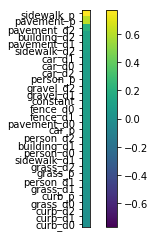

In [50]:
n_features = 40

feature_names = features
# weights = np.random.randn(n_features)

# select top 15 high and low features
indices = np.argsort(old_weights)
n_top = 15
top = np.hstack((indices[:n_top], indices[-n_top:]))[::-1]

vmax = np.abs(old_weights).max()

plt.clf()
plt.imshow(old_weights[top].reshape((-1,1)),interpolation='nearest', cmap="viridis", vmin=-vmax, vmax=vmax)
plt.axes().xaxis.set_visible(False)
plt.colorbar()

tick_marks = np.arange(2 * n_top)
plt.yticks(tick_marks, [feature_names[i] for i in top]) 

In [20]:
old_weights[24]

0.058845

([<matplotlib.axis.YTick at 0x11b56cc18>,
 <a list of 30 Text yticklabel objects>)

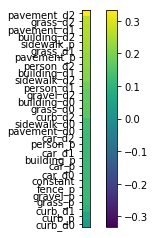

In [21]:
n_features = 40

feature_names = features
# weights = np.random.randn(n_features)

# select top 15 high and low features
indices = np.argsort(new_weights)
n_top = 15
top = np.hstack((indices[:n_top], indices[-n_top:]))[::-1]

vmax = np.abs(new_weights).max()

plt.clf()
plt.imshow(new_weights[top].reshape((-1,1)),interpolation='nearest', cmap="viridis", vmin=-vmax, vmax=vmax)
plt.axes().xaxis.set_visible(False)
plt.colorbar()

tick_marks = np.arange(2 * n_top)
plt.yticks(tick_marks, [feature_names[i] for i in top]) 

In [22]:
new_weights[24]

0.266237

In [23]:
labels = ["pavement", "sidewalk", "person", "car", "building", "grass", "curb", "fence", "gravel", "tracker"]

In [24]:
old_weights[37:40]

array([0.00774824, 0.168684  , 0.381657  ])

In [41]:
old_weights[5:9], new_weights[13:17]

(array([0.085569 , 0.0963668, 0.100675 , 0.0958602]),
 array([0.117352, 0.116552, 0.119279, 0.122152]))

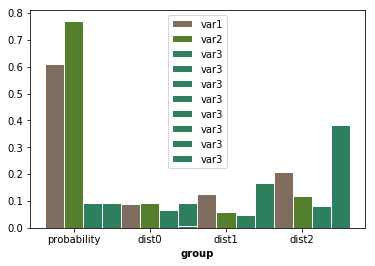

In [25]:
# bar chart plot

pavement = old_weights[1:5]
sidewalk = old_weights[5:9]
person = old_weights[9:13]
car = old_weights[13:17]
building = old_weights[17:21]
grass = old_weights[21:25]
curb = old_weights[25:29]
fence = old_weights[29:33]
gravel = old_weights[33:37]
tracker = np.append(old_weights[0], old_weights[37:40])

# set width of bar
barWidth = 0.25

# Set position of bar on X axis
r1 = np.arange(len(pavement))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]
r5 = [x + barWidth for x in r3]
r6 = [x + barWidth for x in r3]
r7 = [x + barWidth for x in r3]
r8 = [x + barWidth for x in r3]
r9 = [x + barWidth for x in r3]
r10 = [x + barWidth for x in r3]
 
# Make the plot
plt.bar(r1, pavement, color='#7f6d5f', width=barWidth, edgecolor='white', label='var1')
plt.bar(r2, sidewalk, color='#557f2d', width=barWidth, edgecolor='white', label='var2')
plt.bar(r3, person, color='#2d7f5e', width=barWidth, edgecolor='white', label='var3')
plt.bar(r4, car, color='#2d7f5e', width=barWidth, edgecolor='white', label='var3')
plt.bar(r5, building, color='#2d7f5e', width=barWidth, edgecolor='white', label='var3')
plt.bar(r6, grass, color='#2d7f5e', width=barWidth, edgecolor='white', label='var3')
plt.bar(r7, curb, color='#2d7f5e', width=barWidth, edgecolor='white', label='var3')
plt.bar(r8, fence, color='#2d7f5e', width=barWidth, edgecolor='white', label='var3')
plt.bar(r9, gravel, color='#2d7f5e', width=barWidth, edgecolor='white', label='var3')
plt.bar(r10, tracker, color='#2d7f5e', width=barWidth, edgecolor='white', label='var3')
 
# Add xticks on the middle of the group bars
plt.xlabel('group', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(pavement))], ['probability', 'dist0', 'dist1', 'dist2'], )
 
# Create legend & Show graphic
plt.legend()
plt.show()


In [31]:
old_weights = old_weights[0:37]

In [32]:
len(old_weights)

37

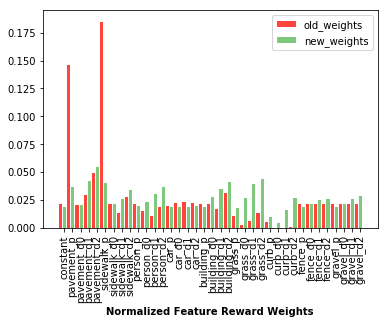

In [43]:
bar1 = old_weights / np.sum(old_weights)
bar2 = new_weights / np.sum(new_weights)

barWidth = 0.5

r1 = np.arange(len(bar1))
r2 = [x + barWidth for x in r1]

plt.bar(r1, bar1, color='#ff443b', width=barWidth, edgecolor='white', label='old_weights')
plt.bar(r2, bar2, color='#7ec97b', width=barWidth, edgecolor='white', label='new_weights')

plt.xlabel('Normalized Feature Reward Weights', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(bar1))], features, rotation=90)

plt.legend()
plt.show()

In [44]:
norm_old_weights = old_weights / np.sum(old_weights)
norm_new_weights = new_weights / np.sum(new_weights)

In [46]:
# grass
norm_old_weights[21:25], norm_new_weights[21:25]

(array([0.01174381, 0.00363889, 0.00674868, 0.01418232]),
 array([0.01839762, 0.02797311, 0.03970627, 0.04424647]))

In [45]:
# pavement
norm_old_weights[1:5], norm_new_weights[1:5]

(array([0.14699938, 0.02154418, 0.03052048, 0.04967824]),
 array([0.03755076, 0.02142448, 0.04259535, 0.05545213]))

In [48]:
# car
norm_old_weights[13:17], norm_new_weights[13:17]

(array([0.02062311, 0.0232255 , 0.02426383, 0.0231034 ]),
 array([0.01950297, 0.01937001, 0.01982322, 0.02030069]))